# Introduction
Baseball is a sport that has been revolutionized by analytics. Introduced to pop culture by the film Moneyball, which depicted a small-market team (the Oakland Athletics) achieve success by using statistics in a different way than anyone else, analytics in baseball have advanced significantly since the Athletics in 2002. Not only are there different statistics to represent how good a player's results on the field are, new tecnhology and statistics have been developed to further evaluate players based on their expected results. Here's an example: someone could hit the ball really hard directly at a fielder, and another player could hit the ball not as hard, but right between fielders, and they get a hit. You would prefer a hitter hit the ball hard rather than hitting it not as hard, but if you only look at results, the second player is better. Statistics like exit velocity (how hard the ball is hit) and launch angle (the angle at which the ball comes off the bat) measure inputs, rather than outcomes. These new statistics are called statcast statistics, named after the technological system that makes their collection possible. This is a major shift in what the "best way to play" is: now that we can determine the best inputs, we no longer have to guess the best inputs to get the best outputs. Also, we can determine what the easiest way to get the best outputs are: you win games by scoring runs, and the easiest way to score runs is to hit home runs. Therefore, players are trying to hit as many home runs as possible.  
Our goal with this project was to determine "what combination of statcast statistics best predicts the performance of a batter who qualified for the batting title in the years 2015-2019 in a single season". We had two more specific goals within this, namely finding the combination of statcast statistics that best predicts a batter who qualified for the batting title in 2015-2019's offensive performance in terms of OPS+, wrC+, and xWOBA, and finding what combination of statcast statistics best predicts a batter who qualified for the batting title in 2015-2019's UBR.  
Some explanation: statcast was first implemented in 2015, so despite baseball having records back to the late 1800s, we only have statcast data since 2015. Secondly, "who qualified for the batting title" means that we excluded batters with a small number of at-bats during each season. Finally, OPS+, wRC+, and xWOBA are three different statistics used to measure a player's offensive performance.  
We went about this by testing the significance of the relationship between the variables of launch angle average (the average angle at which the ball left a player's bat over a year) and the three offensive performance statistics, as well as creating predicting models for statistics like UBR (a baserunning metric), and our offensive predictors.  
We found significant relation between launch angle and our offensive metrics, and created multiple models that improved over time that eventually were able to predict offensive performance from a small number of significant predictors.
The results of our analysis can be useful in a number of ways: it could be used to predict player performance in future years, and although our research may not be as useful for professional teams with their own analytics departments, it could definitely help someone's chances in a fantasy baseball league.  
Despite finding significant results, some weaknesses in our techniques or in the variables that we used inspired possible further research, such as in the case where we could develop improved regressions by using different launch angle metrics and different offensive predictors.

# Data Description

# statcast_stats_2015-2019.csv

The data are a selected subset from MLB’s STATCAST data set.

https://baseballsavant.mlb.com/leaderboard/custom?year=2018,2017,2016,2015&type=batter&filter=&sort=1&sortDir=desc&min=q&selections=xba,xslg,woba,xwoba,xobp,xiso,exit_velocity_avg,launch_angle_avg,sweet_spot_percent,barrels,barrel_batted_rate,solidcontact_percent,flareburner_percent,poorlyunder_percent,poorlytopped_percent,poorlyweak_percent,hard_hit_percent,z_swing_percent,z_swing_miss_percent,oz_swing_percent,oz_swing_miss_percent,oz_contact_percent,out_zone_swing_miss,out_zone_swing,out_zone_percent,out_zone,meatball_swing_percent,meatball_percent,pitch_count_offspeed,pitch_count_fastball,pitch_count_breaking,pitch_count,iz_contact_percent,in_zone_swing_miss,in_zone_swing,in_zone_percent,in_zone,edge_percent,edge,whiff_percent,swing_percent,pull_percent,straightaway_percent,opposite_percent,batted_ball,f_strike_percent,groundballs_percent,groundballs,flyballs_percent,flyballs,linedrives_percent,linedrives,popups_percent,popups,n_bolts,hp_to_1b,sprint_speed,&chart=false&x=xba&y=xba&r=no&chartType=beeswarm

## Motivation<br>
BaseballSavant is a site dedicated to providing player matchups, Statcast metrics, and advanced statistics in a simple and easy-to-view way. Daren Willman created the website as an employee of MLB. MLB funded the creation of this data set.<br><br>
## Composition<br>
The only instance of the data is statistics of years of play by professional baseball players in MLB, of which there are 708 instances (of that one type) in this dataset. This dataset is a subset of a larger set. The larger set is all available statistics from BaseballSavant for every MLB player during the timespan 2015-2020. The sample is representative of the larger set, as we set a minimum threshold for Plate Appearances (MLB qualifies players for awards at 502 Plate Appearances), so we only exclude player years that had relatively small sample sizes in terms of Plate Appearences. The data in each instance consists of Statcast statistics, normal batting statistics, name, and year. Important statistics are detailed below in the table. There are no labels or targets associated with each instance. There is missing information in the dataset: in the column hp_to_1b, in the years 2015 and 2016, data is missing. There is one instance of relationships between individual instances, in the column that shows which team the player belongs to. You can determine which players are on the same team from this column. This relationship is not made explicit. There are no recommended data splits. There are no errors, sources of noise, or redundancies in the dataset. The dataset relies on game files from MLB Advanced Media, L.P. There are no guarantees, but it would be highly unlikely for MLB to cease producing public game files. There are no restrictions associated with any of the external resources. The link provided by baseballsavant to external resources is http://mlb.mlb.com/. This link does not lead to any datasets, the link is to the MLB website’s home page. I could not find the individual game files with the raw data used by MLB to create the dataset we are using. The dataset does not contain data that might be considered confidential. The dataset does not contain data that, if viewed directly, might be offensive, insulting, threatening, or might otherwise cause anxiety. The data relates to people, and the data is observations of performance by the professional athletes to whom it relates. The dataset does not specify any subpopulations. It is possible to identify individuals as their names are included in the data set. The dataset does not contain data that might be considered sensitive in any way.<br><br>
## Collection Process<br>
MLB does not say how they collect visually observable game data, but a possible way it could be done is by the game record of the official scorer, who decides some subjective elements of the game record (such as Errors). Some of the data was directly observable, some of the data was collected using Statcast. Statcast is a state-of-the-art tracking technology, capable of measuring previously unquantifiable aspects of the game. Set up in all 30 Major League ballparks, Statcast collects data using a series of high-resolution optical cameras along with radar equipment. The technology precisely tracks the location and movements of the ball and every player on the field, resulting in an unparalleled amount of information covering everything from the pitcher to the batter to baserunners and defensive players. These mechanisms are validated through a process called “MLB Ground Truth Testing”, a collaboration with WSU’s Sports Science Lab (further reading: https://technology.mlblogs.com/mlb-ground-truth-testing-ec87c73450b9). The dataset that we chose, which is a subset of all Statcast statistics from 2015-2020 was chosen to only include Statcast statistics relating to offensive performance, including batting statistics and player speed statistics. Data collection was performed by paid employees of MLB. Data is collected in real time as games are played, over the span that our data was chosen. This timeframe matches the creation timeframe of the data. There were no ethical review processes conducted. The dataset does relate to people, as stated before. The data was not collected from the individuals in question directly; their performances as athletes were observed both visually and mechanically. I could not find evidence that individuals were notified that their performance data was being collected, but they were aware of that fact. I could not find evidence that the individuals in question consented to the collection and use of their data, but due to the specific nature of these individuals being athletes and this data not being personal information, but rather their athletic performance, consent in this fashion does not apply. There has been no analysis of the potential impact of the dataset and its use on data subjects conducted.<br><br>
## Preprocessing/cleaning/labeling<br>
There was no preprocessing done to the data in this dataset.<br><br>
## Uses<br>
This dataset has been used before, mostly in the area of articles written about these statistics or the use of these statistics as tidbits by sports commentators during games. There is no one repository, but sabr.org is a resource with many baseball research papers, some of which use Statcast data. One example of a paper is found at this link: https://lib.ndsu.nodak.edu/ir/handle/10365/28371. This dataset could also be used to determine how to develop and improve a specific player by looking at underlying weaknesses, or how to value a player in the Free Agent market based on projected performance. There is nothing about the composition of this dataset that might impact future uses. I do not believe that there are any tasks for which the dataset should not be used, that are inside the realm of baseball research.<br><br><br>

# Important Variables<br>

| Variable | Name | Description	|
| :- | :- | :- |
|xba|Expected Batting Average (xBA)|xBA measures the likelihood that a batted ball will become a hit|
|xslg|Expected Slugging Percentage (xSLG)|xSLG measure the expected number of bases from a batted ball|
|woba|Weighted On-base Average (wOBA)|wOBA is a version of on-base percentage that accounts for how a player reached base -- instead of simply considering whether a player reached base|
|xwoba|Expected Weighted On-base Average (xwOBA)|xwOBA is wOBA but each way to reach base is affected by a factor considering adjusted run expectancy of a batting event in the context of the season as a whole|
|xiso|Expected Isolated Power|xISO measures a hitter’s expected extra bases per at bat|
|exit_velocity_avg|Average Exit Velocity (Avg EV (MPH))|How fast, on average, in miles per hour, a ball was hit by a batter|
|launch_angle_avg|Average Launch Angle (°)|How high/low, on average, in degrees, a ball was hit by a batter|
|sweet_spot_percent|Sweet Spot %|Percentage of batted balls with a launch angle between 8 and 32 degrees|
|barrels|Barrels|A batted ball with the perfect combination of exit velocity and launch angle|
|barrel_batted_rate|Barrel%|Barrels per plate appearence|
|solidcontact_percent|Solid Contact%|Percent of contact classified as solid|
|hard_hit_percent|Hard Hit Rate|Percent of contact with an exit velocity of 95+ MPH|
|z_swing_percent|Z-Swing%|Swings at pitches inside the zone / pitches inside the zone|
|z_swing_miss_percent|Z-SwingMiss%|Swings and misses at pitches inside the zone / pitches inside the zone|
|oz_swing_percent|O-Swing%|Swings at pitches outside the zone / pitches outside the zone|
|out_zone_swing_miss|O-SwingMiss%|Swings and misses at pitches outside the zone / pitches outside the zone|
|out_zone_swing|Out of Zone Swings|Swings at pitches outside the zone|
|out_zone_percent|Out Zone%|Percent of pitches outside the zone|
|out_zone|Out of Zone|Pitches outside the zone|
|meatball_swing_percent|Meatball Swing %|Swings at meatballs / meatballs, Meatball is defined as a fastball over the middle of the plate|
|meatball_percent|Meatball %|Meatballs / all pitches|
|pitch_count_offspeed|# Offspeed|# of offspeed pitches|
|pitch_count_fastball|# Fastball|# of fastballs|
|pitch_count_breaking|# Breaking|# of breaking balls|
|pitch_count|# Pitches|Total # of pitches|
|iz_contact_percent|Z-Contact%|Number of pitches on which contact was made on pitches inside the zone / Swings on pitches inside the zone|
|in_zone_swing_miss|In Zone Swing & Miss|Swings and misses at pitches inside the zone|
|in_zone_swing|In Zone Swings|Swings at pitches inside the zone|
|in_zone_percent|In Zone %|Percent of pitches inside the zone|
|in_zone|In Zone|Number of pitches inside the zone|
|edge_percent|Edge %|Percent of pitches on the edge of the strike zone|
|edge|Edge|Number of pitches on the edge of the strike zone|
|whiff_percent|Whiff %|Swings and misses / pitches|
|n_bolts|# Bolts|Number of runs where the player’s sprint speed is at least 30 ft/sec|
|hp_to_1b|Home to First|Time elapsed from bat on ball contact to the moment when the batter reaches first base (average on competitive runs)|
|sprint_speed|Sprint Speed (ft/sec)|Average speed during the fastest 1 second window (ft/sec) of the top 2/3 of competitive runs|

# 2015_batter_OPS+.csv, 2016_batter_OPS+.csv, 2017_batter_OPS+.csv, 2018_batter_OPS+.csv, 2019_batter_OPS+.csv

Raw source data can be found at these links:
https://www.baseball-reference.com/leagues/MLB/2019-standard-batting.shtml, https://www.baseball-reference.com/leagues/MLB/2018-standard-batting.shtml,
https://www.baseball-reference.com/leagues/MLB/2017-standard-batting.shtml,
https://www.baseball-reference.com/leagues/MLB/2016-standard-batting.shtml,
https://www.baseball-reference.com/leagues/MLB/2015-standard-batting.shtml<br>

## Motivation<br>
SportsReference’s Primary Aim is to answer their users' questions with the easiest-to-use, fastest, and most complete sports statistics anywhere. SportsReference is a for-profit company, founded by Sean Forman, that created this dataset, on behalf of themself. I could not find any information about original funding for SportsReference.<br><br>
## Composition<br>
The only instance of the data is statistics of years of play by professional baseball players in MLB, of which there are 7514 instances (of that one type) in this dataset. This dataset is a subset of a larger set. The larger set is all available statistics from BaseballReference for every MLB player during the timespan 1871-2020. The sample is not representative of the larger set, but this is intentional, as we wanted to use data from the years 2015-2019 only to match with our data from BaseballSavant. The data in each instance consists of a set of normal batting statistics, name, and year, and positional data. Important statistics are detailed below in the table. There are no labels or targets associated with each instance. There is no missing information in the dataset. There is one instance of relationships between individual instances, in the column that shows which team the player belongs to. You can determine which players are on the same team from this column. This relationship is not made explicit. There are no recommended data splits. There are no errors or sources of noise, or redundancies in the dataset. The dataset relies on game files from MLB Advanced Media, L.P. There are no guarantees, but it would be highly unlikely for MLB to cease producing public game files. There are no restrictions associated with any of the external resources. The dataset does not contain data that might be considered confidential. The dataset does not contain data that, if viewed directly, might be offensive, insulting, threatening, or might otherwise cause anxiety. The data relates to people, and the data is observations of performance by the professional athletes to whom it relates. The dataset does not specify any subpopulations. It is possible to identify individuals as their names are included in the data set. The dataset does not contain data that might be considered sensitive in any way.<br><br>
## Collection Process<br>
SportsReference does not say how they acquired the statistics that are in the dataset, but these statistics could feasibly have been calculated through the use of Retrosheet, which SportsReference discloses that it uses for game data and transactions. All of the data in the dataset is also directly observable. The dataset that we chose, which is a subset of all SportsReference baseball statistics from 1871-2020 was chosen to only include batting statistics relating from 2015-2019 so we could associate them with the statistics we collected from BaseballSavant. Data collection was performed by paid employees of SportsReference. Data is collected in real time as games are played, over the span that our data was chosen. This timeframe matches the creation timeframe of the data. There were no ethical review processes conducted. The dataset does relate to people, as stated before. The data was not collected from the individuals in question directly; their performances as athletes were observed both visually and mechanically. I could not find evidence that individuals were notified that their performance data was being collected, but they were aware of that fact. I could not find evidence that the individuals in question consented to the collection and use of their data, but due to the specific nature of these individuals being athletes and this data not being personal information, but rather their athletic performance, consent in this fashion does not apply. There has been no analysis of the potential impact of the dataset and its use on data subjects conducted.<br><br>
## Preprocessing/cleaning/labeling<br>
There was no preprocessing done to the data in this dataset.<br><br>
## Uses<br>
This dataset has been used before, mostly in articles written about these statistics or the use of these statistics as tidbits by sports commentators during games. There is no one repository, but sabr.org is a resource with many baseball research papers, some of which use batting data from SportsReference. One example of a paper is found at this link: https://sabr.org/journal/article/top-50-players-in-minnesota-twins-history/.
This dataset could also be used to determine how good a player is in comparison to other players in the league, as well as other players in history. Another possible use is determining which defensive positions are correlated with the best offensive performance. There is nothing about the composition of this dataset that might impact future uses. I do not believe that there are any tasks for which the dataset should not be used, that are inside the realm of baseball research.<br><br>

# Important Variables<br>

|Variable|Name|Description|
| :- | :- | :- |
|Name|Name|Player full name|
|PA|# Plate Appearances|A Plate Appearance refers to a player’s turn batting|
|OBP|On-base Percentage|How frequently a batter reaches base per plate appearance, including hits, walks, and hit by pitches|
|SLG|Slugging Percentage|The total number of bases per at bat (only including hits)|
|OPS|On-base Plus Slugging|On-base Percentage plus Slugging Percentage|
|OPS+|On-base Plus Slugging Plus|League-adjusted OPS. 100 is league average, 120 is 20% better than league average, etc. (OPS / league OPS, adjusted for park factors) x 100|

# UBR_wRC+_data_2015-2019.csv

## Motivation<br>
FanGraphs does not provide any information regarding their motivation. Frangraphs was founded by Sean Forman. FanGraphs created this data set on behalf of FanGraphs. I could not find any information about funding for FanGraphs.<br><br>
## Composition<br>
The only instance of the data is statistics of years of play by professional baseball players in MLB, of which there are 707 instances (of that one type) in this dataset. This dataset is a subset of a larger set. The larger set is all available statistics from FanGraphs for every MLB player during the timespan 1871-2020. The sample is not representative of the larger set, but this is intentional, as we wanted to use data from the years 2015-2019 only to match with our data from BaseballSavant. The data in each instance consists of a set of batting statistics, name, and baserunning statistics. Important statistics are detailed below in the table. There are no labels or targets associated with each instance. There is no missing information in the dataset. There is one instance of relationships between individual instances, in the column that shows which team the player belongs to. You can determine which players are on the same team from this column. This relationship is not made explicit. There are no recommended data splits. There are no errors or sources of noise, or redundancies in the dataset. The dataset relies on game files from MLB Advanced Media, L.P. There are no guarantees, but it would be highly unlikely for MLB to cease producing public game files. There are no restrictions associated with any of the external resources. The dataset does not contain data that might be considered confidential. The dataset does not contain data that, if viewed directly, might be offensive, insulting, threatening, or might otherwise cause anxiety. The data relates to people, and the data is observations of performance by the professional athletes to whom it relates. The dataset does not specify any subpopulations. It is possible to identify individuals as their names are included in the data set. The dataset does not contain data that might be considered sensitive in any way.<br><br>

## Collection Process<br>
FanGraphs does not say how they acquired the statistics that are in the dataset, but the most official source of this data is MLB. All the data in the dataset is also directly observable. The dataset that we chose, which is a subset of all FanGraphs baseball statistics from 1871-2020 was chosen to only include batting statistics relating from 2015-2019 so we could associate them with the statistics we collected from BaseballSavant, while also including statistics exclusive to FanGraphs. Data collection was performed by FanGraphs’ staff. I could not find information on whether or not these staff members were paid to perform the collection. Data is collected in real time as games are played, over the span that our data was chosen. This timeframe matches the creation timeframe of the data. There were no ethical review processes conducted. The dataset does relate to people, as stated before. The data was not collected from the individuals in question directly; their performances as athletes were observed both visually and mechanically. I could not find evidence that individuals were notified that their performance data was being collected, but they were aware of that fact. I could not find evidence that the individuals in question consented to the collection and use of their data, but due to the specific nature of these individuals being athletes and this data not being personal information, but rather their athletic performance, consent in this fashion does not apply. There has been no analysis of the potential impact of the dataset and its use on data subjects conducted.<br><br>
## Preprocessing/cleaning/labeling<br>
There was no preprocessing done to the data in this dataset.<br>
## Uses<br>
This dataset has been used before, mostly in articles written about these statistics or the use of these statistics as tidbits by sports commentators during games. There is no one repository, but https://www.baseball-almanac.com/articles/articles.shtml is a resource with many baseball research papers, some of which use offense data from FanGraphs. One example of a paper is found at this link: https://conservancy.umn.edu/handle/11299/199934.
This dataset could also be used to determine which players are the best baserunners, and if there is a correlation between offensive performance and baserunning aptitude. There is nothing about the composition of this dataset that might impact future uses. I do not believe that there are any tasks for which the dataset should not be used, that are inside the realm of baseball research.<br>

# Important Variables<br>

|Variable|Name|Description|
| :- | :- | :- |
|Name|Name|Player full name|
|wRAA|Weighted Runs Above Average|((wOBA - wOBA of the entire league) / annual wOBA scale) x PA: this is a conversion of wOBA into a counting stat, which means you can sum multiple instances of this statistic to find cumulative value|
|wRC+|Weighted Runs Created Plus|wRC+ is a rate statistic which attempts to credit a hitter for the value of each outcome (single, double, etc) rather than treating all hits or times on base equally, while also controlling for park effects and the current run environment|
|wRC|Weighted Runs Created|wRC is a counting stat for wRC+ that does not take into account park effects or the current run environment|
|UBR|Ultimate Base Running|UBR accounts for the value a player adds to their team via base running on non-stolen base plays (e.g. going from 1st base to 3rd base on a single, getting thrown out at home on another player’s base hit)|



# Preregistration Statement

1. More In-Depth Analysis of Launch Angle:
In our exploratory data analysis, we noticed that launch angle average did not have a high correlation coefficient with offensive value stats such as OPS+ and wRC+. We think this is because there is an ideal numerical range of average launch angles, and values above and below this range are not as good offensively. We plan to look through the launch angle average data, make a histogram of the data, and then assign different ranges of average launch angles to a new categorical predictor, using the map() function. Then we will perform a linear regression of this new categorical predictor on our offensive value stats, hoping to identify ranges of launch angles which have significant relationships with the offensive value stats.

2. More In-Depth Analysis of Sprint Speed/UBR: In our exploratory data analyses we noticed that there was a negative association between batters with higher sprint speeds and their offensive stats. Therefore, want to dig into why this relationship occurs and possibly narrow down some significant statistics that are more strongly associated with sprint speed. In addition to the analyses on sprint speed we will examine UBR, which is a base running statistic. We will perform further anlyses on both UBR and sprint speed in relation to other offensive stats, including but not limited to, OBP, SLG, and ISO. This would be done in order to see which offensive stats have the strongest relationship to UBR.  

# Preregistered Analysis: More In-Depth Analysis of Launch Angle
In our exploratory data analysis, we noticed that launch angle average did not have a high correlation coefficient with offensive value stats such as OPS+ and wRC+. We think this is because there is an ideal numerical range of average launch angles for peak offensive performance.
Over the past few years, there has been a major emphasis on changing the type of swing a batter would use to optimize their success, away from the traditional flat or even downwards-angled swing used to generate line drives, balls hit with a launch angle between 10 and 25 degrees, to a swing emphasizing flyballs, balls hit with a launch angle between 25 and 50 degrees (https://www.si.com/mlb/2018/03/21/evolution-swing-home-run-opening-day).  
To test our hypothesis that launch angle affects offensive performance, we ran linear regressions on average launch angle and each of our three major offensive value stats. The goal was to see if there was a regression score that would show some connection between increasing launch angle and offensive performance. We see that there is little to no relation between ranges of average launch angle and performance.


In [1]:
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import sklearn.linear_model
from sklearn.linear_model import LinearRegression
import seaborn as sns

In [2]:
data_2019 = pd.read_csv('2019_statcast_data_final.csv')
data_2018 = pd.read_csv('2018_statcast_data_final.csv')
data_2017 = pd.read_csv('2017_statcast_data_final.csv')
data_2016 = pd.read_csv('2016_statcast_data_final.csv')
data_2015 = pd.read_csv('2015_statcast_data_final.csv')

In [3]:
def launch_angle_avg_quartile(n):
    if(n >= q0 and n <= q1):
        return 1
    if(n >= q1 and n <=q2):
        return 2
    if(n >= q2 and n <= q3):
        return 3
    if(n >= q3 and n <= q4):
        return 4

# 2019 Analysis

The boxplot emphasizes how the middle quartiles, despite having a range of only 5 degrees, account for 50% of all average launch angles, the total range of which is almost 5 times that.  
As expected, there is a positive slope to the regression lines. However, the r-squared values of between 0.06 and 0.066 show little to no relation. This is easy to see in any of the graphs using quartiles, which uses a categorical variable based on quartile. The range of offensive performance in each quartile is too large to there to be any significant difference between two quartiles.

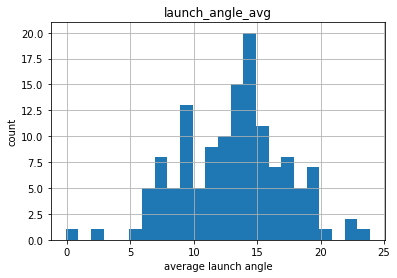

In [4]:
data_2019.hist(column='launch_angle_avg', bins = math.ceil(data_2019['launch_angle_avg'].max() - data_2019['launch_angle_avg'].min()))
plt.xlabel('average launch angle')
plt.ylabel('count')
plt.show()

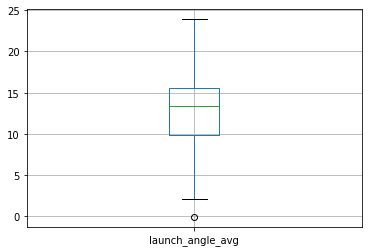

In [5]:
data_2019.boxplot(column='launch_angle_avg')
plt.show()

In [6]:
q0 = data_2019['launch_angle_avg'].quantile(0)
q1 = data_2019['launch_angle_avg'].quantile(0.25)
q2 = data_2019['launch_angle_avg'].quantile(0.5)
q3 = data_2019['launch_angle_avg'].quantile(0.75)
q4 = data_2019['launch_angle_avg'].quantile(1)

test = map(launch_angle_avg_quartile, data_2019['launch_angle_avg'])
test_list = list(test)

data_2019['launch_quartile'] = test_list

wRC+ Model
Predictor: launch angle avg quartile
Regression Slope: 4.815587362541458
R-squared: 0.059275818153434856



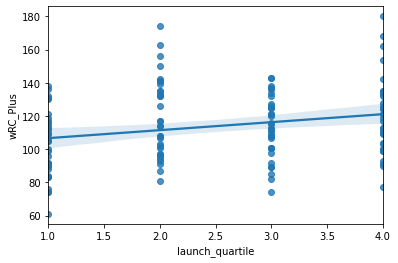

wRC+ Model
Predictor: launch angle avg
Regression Slope: 1.5348982555588562
R-squared: 0.07995509984479932



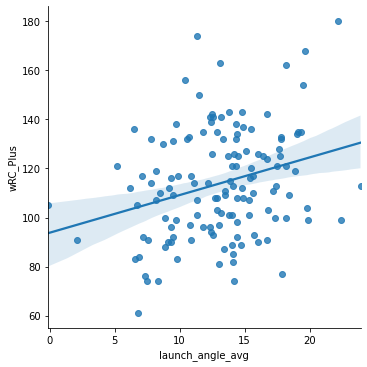

In [7]:
wRC_model_2019 = LinearRegression().fit(data_2019[['launch_quartile']], data_2019[['wRC_Plus']])
print('wRC+ Model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2019.coef_[0][0], wRC_model_2019.score(data_2019[['launch_quartile']], data_2019[['wRC_Plus']])))

sns.regplot(x="launch_quartile", y="wRC_Plus", data=data_2019)
plt.show()

wRC_model_2019_2 = LinearRegression().fit(data_2019[['launch_angle_avg']], data_2019[['wRC_Plus']])
print('wRC+ Model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2019_2.coef_[0][0], wRC_model_2019_2.score(data_2019[['launch_angle_avg']], data_2019[['wRC_Plus']])))

sns.lmplot(x="launch_angle_avg", y="wRC_Plus", data=data_2019)
plt.show()

OPS+ model
Predictor: launch angle avg quartile
Regression Slope: 4.892302321522083
R-squared: 0.06097813889573045



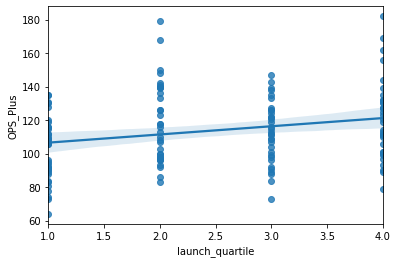

OPS+ model
Predictor: launch angle avg
Regression Slope: 1.5893971281399075
R-squared: 0.08545163957408564



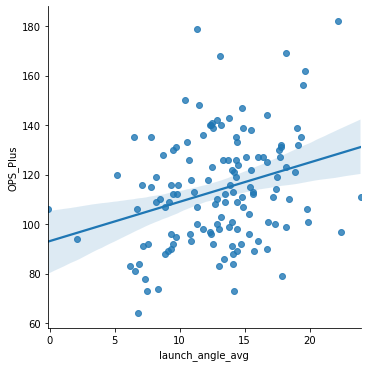

In [8]:
OPS_model_2019 = LinearRegression().fit(data_2019[['launch_quartile']], data_2019[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2019.coef_[0][0], OPS_model_2019.score(data_2019[['launch_quartile']], data_2019[['OPS_Plus']])))

sns.regplot(x="launch_quartile", y="OPS_Plus", data=data_2019)
plt.show()

OPS_model_2019_2 = LinearRegression().fit(data_2019[['launch_angle_avg']], data_2019[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2019_2.coef_[0][0], OPS_model_2019_2.score(data_2019[['launch_angle_avg']], data_2019[['OPS_Plus']])))

sns.lmplot(x="launch_angle_avg", y="OPS_Plus", data=data_2019)
plt.show()

xWOBA model
Predictor: launch angle avg quartile
Regression Slope: 0.007635887589457149
R-squared: 0.06608844901516497



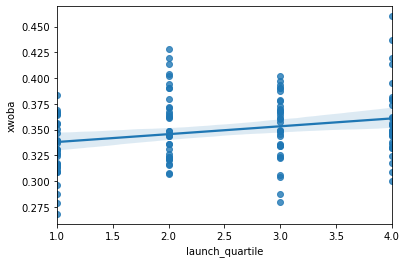

xWOBA model
Predictor: launch angle avg
Regression Slope: 0.002635798882631622
R-squared: 0.10455360364277311



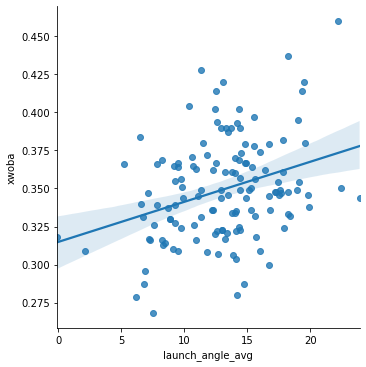

In [9]:
xWOBA_model_2019 = LinearRegression().fit(data_2019[['launch_quartile']], data_2019[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2019.coef_[0][0], xWOBA_model_2019.score(data_2019[['launch_quartile']], data_2019[['xwoba']])))

sns.regplot(x="launch_quartile", y="xwoba", data=data_2019)
plt.show()

xWOBA_model_2019_2 = LinearRegression().fit(data_2019[['launch_angle_avg']], data_2019[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2019_2.coef_[0][0], xWOBA_model_2019_2.score(data_2019[['launch_angle_avg']], data_2019[['xwoba']])))

sns.lmplot(x="launch_angle_avg", y="xwoba", data=data_2019)
plt.show()

In [10]:
#these plots mapped exit velocity to each quartile of launch angles and they all looked like scatterplots except one (2018 q3)

#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2019[data_2019['launch_quartile'] == 1]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2019[data_2019['launch_quartile'] == 2]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2019[data_2019['launch_quartile'] == 3]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2019[data_2019['launch_quartile'] == 4]);

# 2018 Analysis

Similarly to 2019, the R-squared scores for the regressions involving quartiles were very small, even lower than before, showing little to no relation. There was still a positive slope, and like 2019 the boxplot shows that about half of the players we sampled had an average launch angle in a small range, 5-6 degrees.  
One additional analysis that we performed was a regression of average exit velocity, how hard the ball was hit, against offensive performance, for each subset of launch angle quartiles. We did not show the majority of those plots, because it was 60 or so very similar-looking plots, but one that showed significance, the 3rd quartile of launch angles for 2018, is shown below.

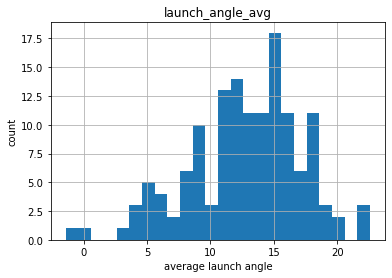

In [11]:
data_2018 = data_2018.head(139)
data_2018.hist(column='launch_angle_avg', bins = math.ceil(data_2018['launch_angle_avg'].max() - data_2018['launch_angle_avg'].min()))
plt.xlabel('average launch angle')
plt.ylabel('count')
plt.show()

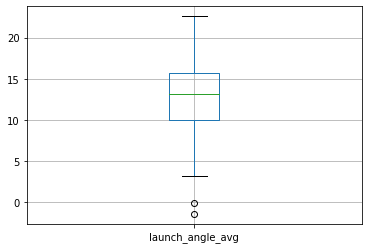

In [12]:
data_2018.boxplot(column='launch_angle_avg')
plt.show()

In [13]:
q0 = data_2018['launch_angle_avg'].quantile(0)
q1 = data_2018['launch_angle_avg'].quantile(0.25)
q2 = data_2018['launch_angle_avg'].quantile(0.5)
q3 = data_2018['launch_angle_avg'].quantile(0.75)
q4 = data_2018['launch_angle_avg'].quantile(1)

dummy_2018 = map(launch_angle_avg_quartile, data_2018['launch_angle_avg'])
dummy_2018 = list(dummy_2018)
data_2018['launch_quartile'] = dummy_2018

wRC+ model
Predictor: launch angle avg quartile
Regression Slope: 3.885254194418684
R-squared: 0.03520633373651294



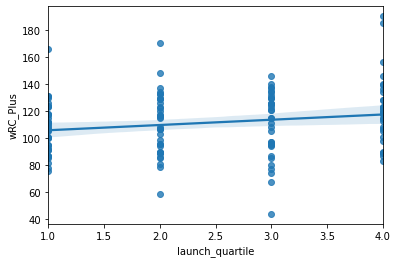

xWOBA model
Predictor: launch angle avg
Regression Slope: 1.0932072390209775
R-squared: 0.04409926574832923



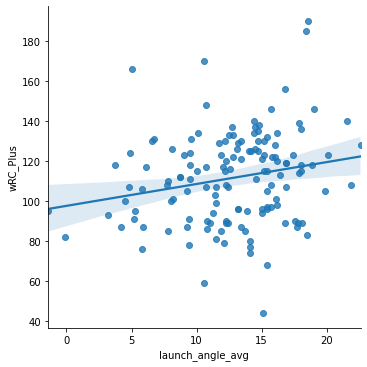

In [14]:
wRC_model_2018 = LinearRegression().fit(data_2018[['launch_quartile']], data_2018[['wRC_Plus']])
print('wRC+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2018.coef_[0][0], wRC_model_2018.score(data_2018[['launch_quartile']], data_2018[['wRC_Plus']])))

sns.regplot(x="launch_quartile", y="wRC_Plus", data=data_2018)
plt.show()

wRC_model_2018_2 = LinearRegression().fit(data_2018[['launch_angle_avg']], data_2018[['wRC_Plus']])
print('xWOBA model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2018_2.coef_[0][0], wRC_model_2018_2.score(data_2018[['launch_angle_avg']], data_2018[['wRC_Plus']])))

sns.lmplot(x="launch_angle_avg", y="wRC_Plus", data=data_2018)
plt.show()

OPS+ model
Predictor: launch angle avg quartile
Regression Slope: 4.368982379226035
R-squared: 0.04563085094069752



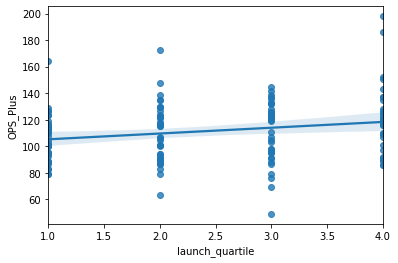

OPS+ model
Predictor: launch angle avg
Regression Slope: 1.2021770841781794
R-squared: 0.05466121830399506



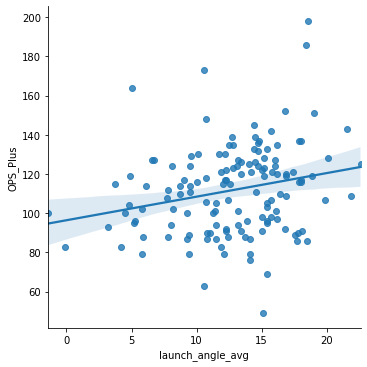

In [15]:
OPS_model_2018 = LinearRegression().fit(data_2018[['launch_quartile']], data_2018[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2018.coef_[0][0], OPS_model_2018.score(data_2018[['launch_quartile']], data_2018[['OPS_Plus']])))

sns.regplot(x="launch_quartile", y="OPS_Plus", data=data_2018)
plt.show()

OPS_model_2018_2 = LinearRegression().fit(data_2018[['launch_angle_avg']], data_2018[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2018_2.coef_[0][0], OPS_model_2018_2.score(data_2018[['launch_angle_avg']], data_2018[['OPS_Plus']])))


sns.lmplot(x="launch_angle_avg", y="OPS_Plus", data=data_2018)
plt.show()

xWOBA model
Predictor: launch angle avg quartile
Regression Slope: 0.005210564033386729
R-squared: 0.02948556707527006



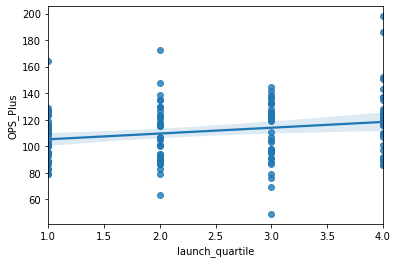

xWOBA model
Predictor: launch angle avg
Regression Slope: 0.0015526708189849351
R-squared: 0.041423160064167575



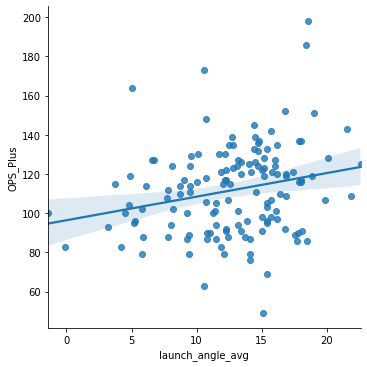

In [16]:
xWOBA_model_2018 = LinearRegression().fit(data_2018[['launch_quartile']], data_2018[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2018.coef_[0][0], xWOBA_model_2018.score(data_2018[['launch_quartile']], data_2018[['xwoba']])))

sns.regplot(x="launch_quartile", y="OPS_Plus", data=data_2018)
plt.show()

xWOBA_model_2018_2 = LinearRegression().fit(data_2018[['launch_angle_avg']], data_2018[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2018_2.coef_[0][0], xWOBA_model_2018_2.score(data_2018[['launch_angle_avg']], data_2018[['xwoba']])))

sns.lmplot(x="launch_angle_avg", y="OPS_Plus", data=data_2018)
plt.show()

In [17]:
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2018[data_2018['launch_quartile'] == 1]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2018[data_2018['launch_quartile'] == 2]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2018[data_2018['launch_quartile'] == 4]);

## 3rd Quartile of Launch Angles, regression of average exit velocity versus offensive performance.  
The R-Squared value of this regression is 0.3, which we would consider significant. However, because this was only one of the many attempts that showed significance, the overall hypothesis that an increase of exit velocity would increase performance for specific subsets of launch angle quartiles was not true.

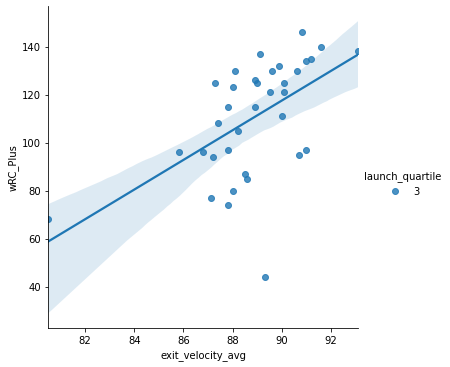

In [18]:
sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2018[data_2018['launch_quartile'] == 3]);

In [19]:
#data_2018[data_2018['launch_quartile'] == 3]

In [20]:
#this is how to do a regression with just the one quartile and exit velo

wRC_model_2018_test = LinearRegression().fit(data_2018[data_2018['launch_quartile'] == 3][['exit_velocity_avg']], data_2018[data_2018['launch_quartile'] == 3]['wRC_Plus'])
print('Predictor: launch angle\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2018_test.coef_[0], wRC_model_2018_test.score(data_2018[data_2018['launch_quartile'] == 3][['exit_velocity_avg']], data_2018[data_2018['launch_quartile'] == 3]['wRC_Plus'])))

Predictor: launch angle
Regression Slope: 6.179710028836911
R-squared: 0.3029750723719338



# 2017 Analysis

2017 shows more of the same. The boxplot remains similar, and the regression scores remain low.

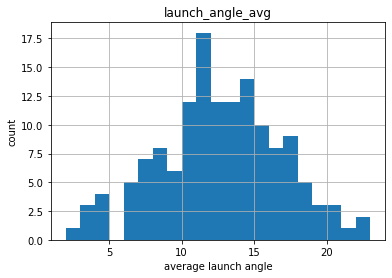

In [21]:
data_2017.hist(column='launch_angle_avg', bins = math.ceil(data_2017['launch_angle_avg'].max() - data_2017['launch_angle_avg'].min()))
plt.xlabel('average launch angle')
plt.ylabel('count')
plt.show()

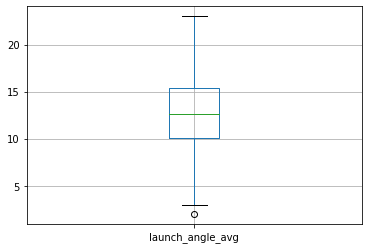

In [22]:
boxplot_2017 = data_2017.boxplot(column='launch_angle_avg')
plt.show()

In [23]:
q0 = data_2017['launch_angle_avg'].quantile(0)
q1 = data_2017['launch_angle_avg'].quantile(0.25)
q2 = data_2017['launch_angle_avg'].quantile(0.5)
q3 = data_2017['launch_angle_avg'].quantile(0.75)
q4 = data_2017['launch_angle_avg'].quantile(1)

dummy_2017 = map(launch_angle_avg_quartile, data_2017['launch_angle_avg'])
data_2017['launch_quartile'] = list(dummy_2017)
#data_2017.head()


wRC+ model
Predictor: launch angle avg quartile
Regression Slope: 4.163613975681083
R-squared: 0.040187167377598976



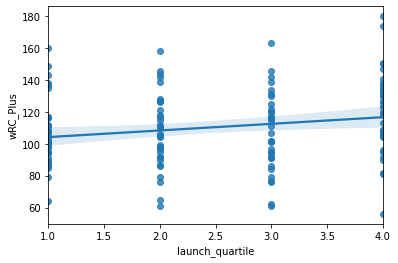

wRC+ model
Predictor: launch angle avg
Regression Slope: 1.0581410716019661
R-squared: 0.03589729108164552



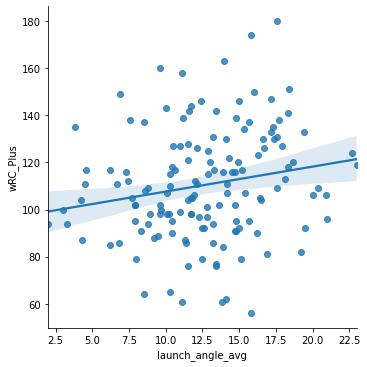

In [24]:
wRC_model_2017 = LinearRegression().fit(data_2017[['launch_quartile']], data_2017[['wRC_Plus']])
print('wRC+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2017.coef_[0][0], wRC_model_2017.score(data_2017[['launch_quartile']], data_2017[['wRC_Plus']])))

sns.regplot(x="launch_quartile", y="wRC_Plus", data=data_2017)
plt.show()

wRC_model_2017_2 = LinearRegression().fit(data_2017[['launch_angle_avg']], data_2017[['wRC_Plus']])
print('wRC+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2017_2.coef_[0][0], wRC_model_2017_2.score(data_2017[['launch_angle_avg']], data_2017[['wRC_Plus']])))

sns.lmplot(x="launch_angle_avg", y="wRC_Plus", data=data_2017)
plt.show()

OPS+ model
Predictor: launch angle avg quartile
Regression Slope: 4.2139833769432045
R-squared: 0.04232233538716923



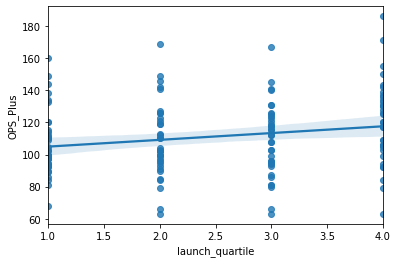

OPS+ model
Predictor: launch angle avg
Regression Slope: 1.0808224052769622
R-squared: -0.20650587171279788



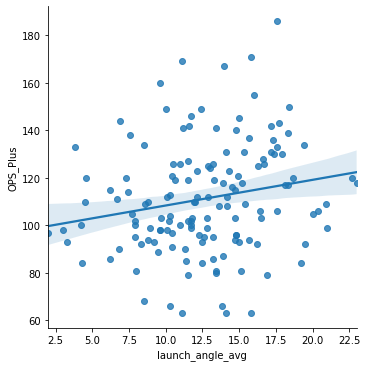

In [25]:
OPS_model_2017 = LinearRegression().fit(data_2017[['launch_quartile']], data_2017[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2017.coef_[0][0], OPS_model_2017.score(data_2017[['launch_quartile']], data_2017[['OPS_Plus']])))

sns.regplot(x="launch_quartile", y="OPS_Plus", data=data_2017)
plt.show()

OPS_model_2017_2 = LinearRegression().fit(data_2017[['launch_angle_avg']], data_2017[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2017_2.coef_[0][0], OPS_model_2017_2.score(data_2017[['launch_quartile']], data_2017[['OPS_Plus']])))

sns.lmplot(x="launch_angle_avg", y="OPS_Plus", data=data_2017)
plt.show()

xWOBA model
Predictor: launch angle avg quartile
Regression Slope: 0.005546136678466984
R-squared: 0.03357125713636788



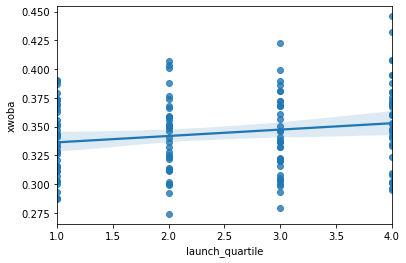

xWOBA model
Predictor: launch angle avg
Regression Slope: 0.0016263290550385635
R-squared: 0.03992375325097297



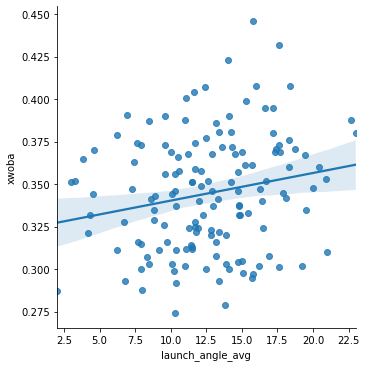

In [26]:
xWOBA_model_2017 = LinearRegression().fit(data_2017[['launch_quartile']], data_2017[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2017.coef_[0][0], xWOBA_model_2017.score(data_2017[['launch_quartile']], data_2017[['xwoba']])))

sns.regplot(x="launch_quartile", y="xwoba", data=data_2017)
plt.show()

xWOBA_model_2017_2 = LinearRegression().fit(data_2017[['launch_angle_avg']], data_2017[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2017_2.coef_[0][0], xWOBA_model_2017_2.score(data_2017[['launch_angle_avg']], data_2017[['xwoba']])))

sns.lmplot(x="launch_angle_avg", y="xwoba", data=data_2017)
plt.show()

In [27]:
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2017[data_2017['launch_quartile'] == 1]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2017[data_2017['launch_quartile'] == 2]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2017[data_2017['launch_quartile'] == 3]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2017[data_2017['launch_quartile'] == 4]);

# 2016 Analysis

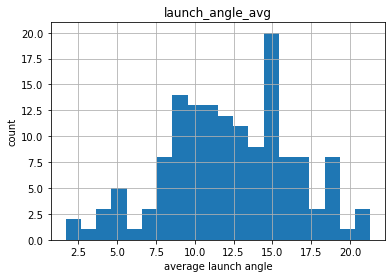

In [28]:
data_2016.hist(column='launch_angle_avg', bins = math.ceil(data_2016['launch_angle_avg'].max() - data_2016['launch_angle_avg'].min()))
plt.xlabel('average launch angle')
plt.ylabel('count')
plt.show()

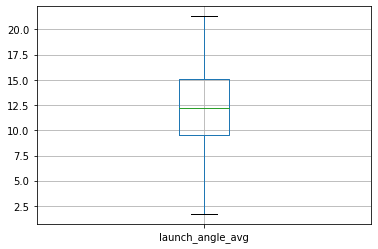

In [29]:
data_2016.boxplot(column='launch_angle_avg')
plt.show()

In [30]:
q0 = data_2016['launch_angle_avg'].quantile(0)
q1 = data_2016['launch_angle_avg'].quantile(0.25)
q2 = data_2016['launch_angle_avg'].quantile(0.5)
q3 = data_2016['launch_angle_avg'].quantile(0.75)
q4 = data_2016['launch_angle_avg'].quantile(1)

dummy_2016 = map(launch_angle_avg_quartile, data_2016['launch_angle_avg'])
data_2016['launch_quartile'] = list(dummy_2016)

wRC+ model
Predictor: launch angle avg quartile
Regression Slope: 4.24390243902439
R-squared: 0.05315623869002373



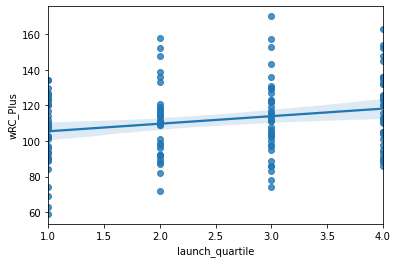

wRC+ model
Predictor: launch angle avg
Regression Slope: 0.9693121842593885
R-squared: 0.036440085051309246



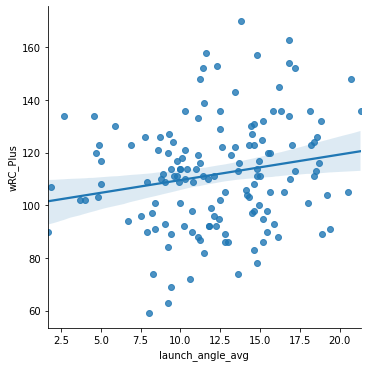

In [31]:
wRC_model_2016 = LinearRegression().fit(data_2016[['launch_quartile']], data_2016[['wRC_Plus']])
print('wRC+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2016.coef_[0][0], wRC_model_2016.score(data_2016[['launch_quartile']], data_2016[['wRC_Plus']])))

sns.regplot(x="launch_quartile", y="wRC_Plus", data=data_2016)
plt.show()

wRC_model_2016_2 = LinearRegression().fit(data_2016[['launch_angle_avg']], data_2016[['wRC_Plus']])
print('wRC+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2016_2.coef_[0][0], wRC_model_2016_2.score(data_2016[['launch_angle_avg']], data_2016[['wRC_Plus']])))

sns.lmplot(x="launch_angle_avg", y="wRC_Plus", data=data_2016)
plt.show()

In [32]:
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2016[data_2016['launch_quartile'] == 1]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2016[data_2016['launch_quartile'] == 2]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2016[data_2016['launch_quartile'] == 3]);
#sns.lmplot(x="exit_velocity_avg", y="wRC_Plus", hue = 'launch_quartile', data=data_2016[data_2016['launch_quartile'] == 4]);

OPS+ model
Predictor: launch angle avg quartile
Regression Slope: 4.303523035230351
R-squared: 0.05634515774470583



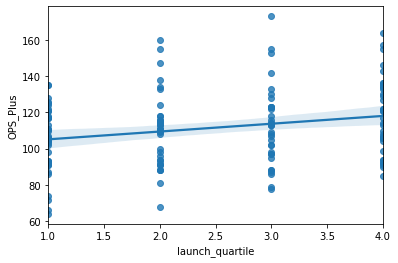

OPS+ model
Predictor: launch angle avg
Regression Slope: 1.0077392954530526
R-squared: 0.04060067939550893



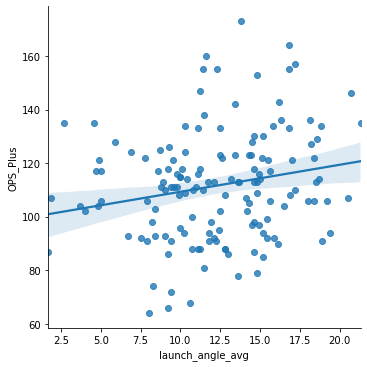

In [33]:
OPS_model_2016 = LinearRegression().fit(data_2016[['launch_quartile']], data_2016[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2016.coef_[0][0], OPS_model_2016.score(data_2016[['launch_quartile']], data_2016[['OPS_Plus']])))

sns.regplot(x="launch_quartile", y="OPS_Plus", data=data_2016)
plt.show()

OPS_model_2016_2 = LinearRegression().fit(data_2016[['launch_angle_avg']], data_2016[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2016_2.coef_[0][0], OPS_model_2016_2.score(data_2016[['launch_angle_avg']], data_2016[['OPS_Plus']])))

sns.lmplot(x="launch_angle_avg", y="OPS_Plus", data=data_2016)
plt.show()

xWOBA model
Predictor: launch angle avg quartile
Regression Slope: 0.006498644986449865
R-squared: 0.044705707479595014



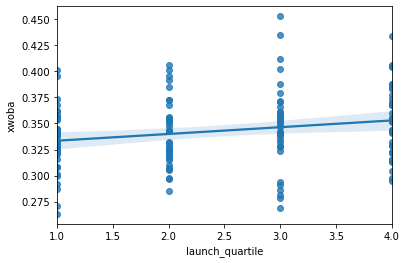

xWOBA model
Predictor: launch angle avg
Regression Slope: 0.0013261754749748752
R-squared: 0.024465151519171613



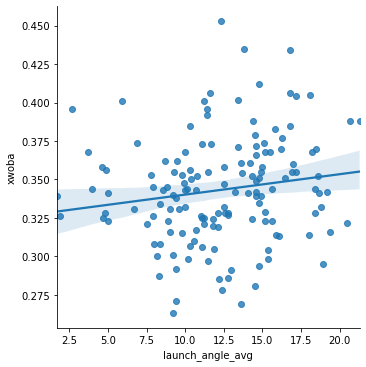

In [34]:
xWOBA_model_2016 = LinearRegression().fit(data_2016[['launch_quartile']], data_2016[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2016.coef_[0][0], xWOBA_model_2016.score(data_2016[['launch_quartile']], data_2016[['xwoba']])))

sns.regplot(x="launch_quartile", y="xwoba", data=data_2016)
plt.show()

xWOBA_model_2016_2 = LinearRegression().fit(data_2016[['launch_angle_avg']], data_2016[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2016_2.coef_[0][0], xWOBA_model_2016_2.score(data_2016[['launch_angle_avg']], data_2016[['xwoba']])))

sns.lmplot(x="launch_angle_avg", y="xwoba", data=data_2016)
plt.show()

# 2015 Analysis

2015 showed the highest regression score of this entire analysis, a R-Squared score of 0.074 with xWOBA. This being the highest regression score does not bode well for our hypothesis. There is nothing else new or different to note in this year of analysis

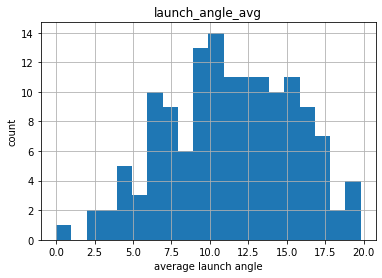

In [35]:
data_2015.hist(column='launch_angle_avg', bins = math.ceil(data_2015['launch_angle_avg'].max() - data_2015['launch_angle_avg'].min()))
plt.xlabel('average launch angle')
plt.ylabel('count')
plt.show()

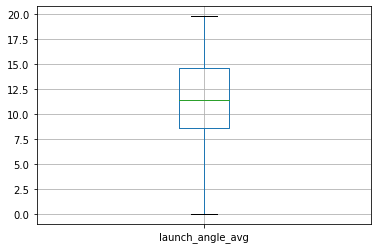

In [36]:
boxplot_2015 = data_2015.boxplot(column='launch_angle_avg')
plt.show()

In [37]:
q0 = data_2015['launch_angle_avg'].quantile(0)
q1 = data_2015['launch_angle_avg'].quantile(0.25)
q2 = data_2015['launch_angle_avg'].quantile(0.5)
q3 = data_2015['launch_angle_avg'].quantile(0.75)
q4 = data_2015['launch_angle_avg'].quantile(1)

dummy_2015 = map(launch_angle_avg_quartile, data_2015['launch_angle_avg'])
data_2015['launch_quartile'] = list(dummy_2015)

wRC+ model
Predictor: launch angle avg quartile
Regression Slope: 5.04424568624347
R-squared: 0.05726549670818393



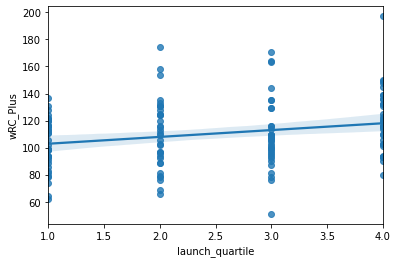

wRC+ model
Predictor: launch angle avg
Regression Slope: 1.3600121888270915
R-squared: 0.056562434467368417



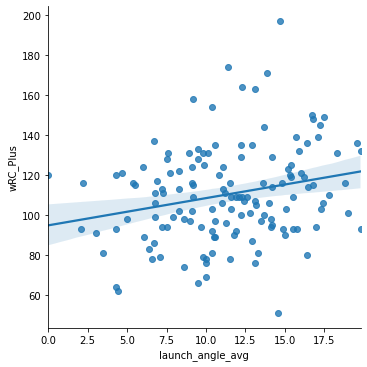

In [38]:
wRC_model_2015 = LinearRegression().fit(data_2015[['launch_quartile']], data_2015[['wRC_Plus']])
print('wRC+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2015.coef_[0][0], wRC_model_2015.score(data_2015[['launch_quartile']], data_2015[['wRC_Plus']])))

sns.regplot(x="launch_quartile", y="wRC_Plus", data=data_2015)
plt.show()

wRC_model_2015_2 = LinearRegression().fit(data_2015[['launch_angle_avg']], data_2015[['wRC_Plus']])
print('wRC+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_2015_2.coef_[0][0], wRC_model_2015_2.score(data_2015[['launch_angle_avg']], data_2015[['wRC_Plus']])))

sns.lmplot(x="launch_angle_avg", y="wRC_Plus", data=data_2015)
plt.show()

OPS+ model
Predictor: launch angle avg quartile
Regression Slope: 5.049707139464936
R-squared: 0.060095140844858674



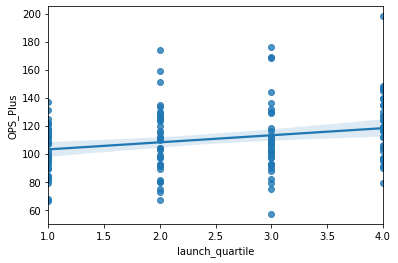

OPS+ model
Predictor: launch angle avg
Regression Slope: 1.355513029677907
R-squared: 0.05883778155957475



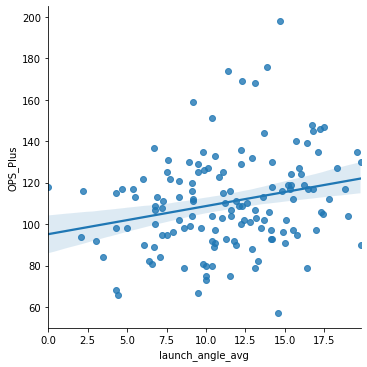

In [39]:
OPS_model_2015 = LinearRegression().fit(data_2015[['launch_quartile']], data_2015[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2015.coef_[0][0], OPS_model_2015.score(data_2015[['launch_quartile']], data_2015[['OPS_Plus']])))

sns.regplot(x="launch_quartile", y="OPS_Plus", data=data_2015)
plt.show()

OPS_model_2015_2 = LinearRegression().fit(data_2015[['launch_angle_avg']], data_2015[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_2015_2.coef_[0][0], OPS_model_2015_2.score(data_2015[['launch_angle_avg']], data_2015[['OPS_Plus']])))

sns.lmplot(x="launch_angle_avg", y="OPS_Plus", data=data_2015)
plt.show()

xWOBA model
Predictor: launch angle avg quartile
Regression Slope: 0.009014445148013294
R-squared: 0.07367005936847748



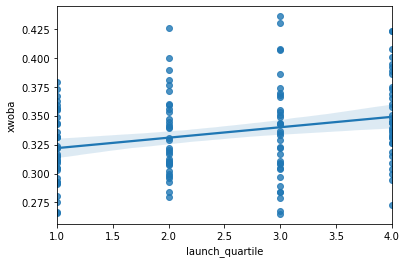

xWOBA model
Predictor: launch angle avg
Regression Slope: 0.002185547455366809
R-squared: 0.058840373831479886



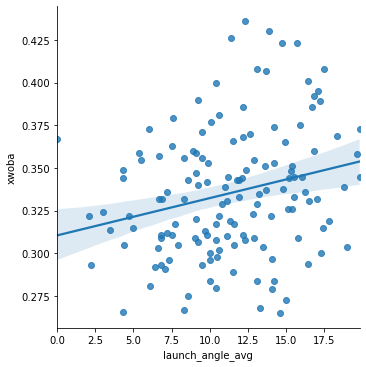

In [40]:
xWOBA_model_2015 = LinearRegression().fit(data_2015[['launch_quartile']], data_2015[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2015.coef_[0][0], xWOBA_model_2015.score(data_2015[['launch_quartile']], data_2015[['xwoba']])))

sns.regplot(x="launch_quartile", y="xwoba", data=data_2015)
plt.show()

xWOBA_model_2015_2 = LinearRegression().fit(data_2015[['launch_angle_avg']], data_2015[['xwoba']])
print('xWOBA model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_2015_2.coef_[0][0], xWOBA_model_2015_2.score(data_2015[['launch_angle_avg']], data_2015[['xwoba']])))

sns.lmplot(x="launch_angle_avg", y="xwoba", data=data_2015)
plt.show()

# 2015-2019 (All years combined) Analysis

We also tried doing the regressions when all of the data had been combined and then separated into quartiles, like in the analysis for individual years. It is clear to see that there is a positive slope 

In [41]:
all_dfs = [data_2015,data_2016,data_2017,data_2018,data_2019]
all_data = pd.concat(all_dfs).reset_index(drop=True)

q0 = all_data['launch_angle_avg'].quantile(0)
q1 = all_data['launch_angle_avg'].quantile(0.25)
q2 = all_data['launch_angle_avg'].quantile(0.5)
q3 = all_data['launch_angle_avg'].quantile(0.75)
q4 = all_data['launch_angle_avg'].quantile(1)

dummy_all = map(launch_angle_avg_quartile, all_data['launch_angle_avg'])
all_data['launch_quartile'] = list(dummy_all)

wRC+ model
Predictor: launch angle avg quartile
Regression Slope: 4.3948792355728
R-squared: 0.04737495317219864



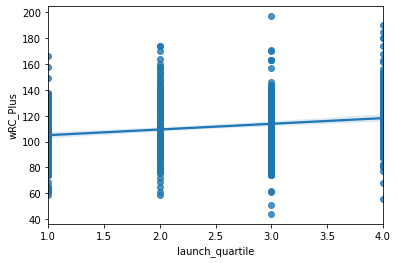

wRC+ model
Predictor: launch angle average
Regression Slope: 1.199656093370689
R-squared: 0.05007331157104544



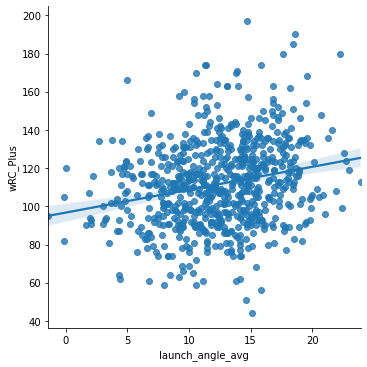

In [42]:
wRC_model_all = LinearRegression().fit(all_data[['launch_quartile']], all_data[['wRC_Plus']])
print('wRC+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_all.coef_[0][0], wRC_model_all.score(all_data[['launch_quartile']], all_data[['wRC_Plus']])))

sns.regplot(x="launch_quartile", y="wRC_Plus", data=all_data)
plt.show()

wRC_model_all_2 = LinearRegression().fit(all_data[['launch_angle_avg']], all_data[['wRC_Plus']])
print('wRC+ model\nPredictor: launch angle average\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_model_all_2.coef_[0][0], wRC_model_all_2.score(all_data[['launch_angle_avg']], all_data[['wRC_Plus']])))

sns.lmplot(x="launch_angle_avg", y="wRC_Plus", data=all_data)
plt.show()

OPS+ model
Predictor: launch angle average quartile
Regression Slope: 4.580078078029932
R-squared: 0.0528257103534443



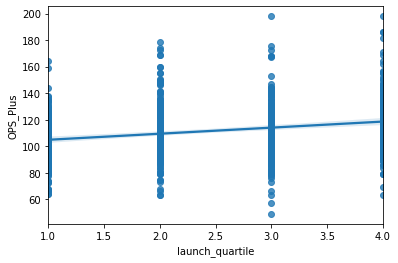

OPS+ model
Predictor: launch angle average
Regression Slope: 1.2448062793361567
R-squared: 0.055352980046875055



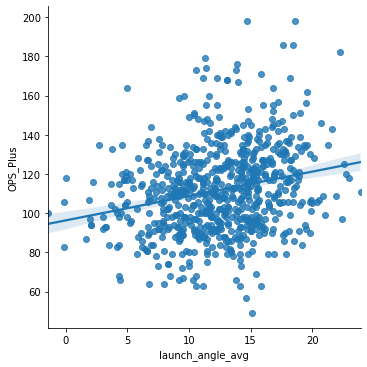

In [43]:
OPS_model_all = LinearRegression().fit(all_data[['launch_quartile']], all_data[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle average quartile\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_all.coef_[0][0], OPS_model_all.score(all_data[['launch_quartile']], all_data[['OPS_Plus']])))

sns.regplot(x="launch_quartile", y="OPS_Plus", data=all_data)
plt.show()

OPS_model_all_2 = LinearRegression().fit(all_data[['launch_angle_avg']], all_data[['OPS_Plus']])
print('OPS+ model\nPredictor: launch angle average\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_model_all_2.coef_[0][0], OPS_model_all_2.score(all_data[['launch_angle_avg']], all_data[['OPS_Plus']])))

sns.lmplot(x="launch_angle_avg", y="OPS_Plus", data=all_data)
plt.show()

xWOBA model
Predictor: launch angle average quartile
Regression Slope: 0.006956956079104106
R-squared: 0.04982629283791551



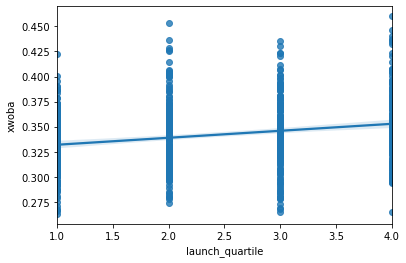

xWOBA model
Predictor: launch angle
Regression Slope: 0.001939215916380131
R-squared: 0.054917438292421905



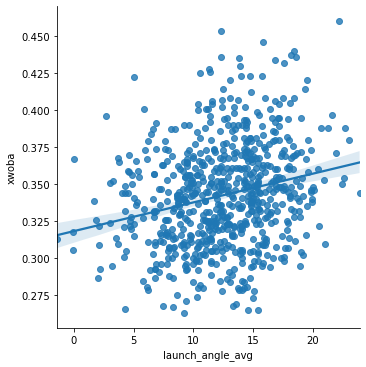

In [44]:
xWOBA_model_all = LinearRegression().fit(all_data[['launch_quartile']], all_data[['xwoba']])
print('xWOBA model\nPredictor: launch angle average quartile\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_all.coef_[0][0], xWOBA_model_all.score(all_data[['launch_quartile']], all_data[['xwoba']])))

sns.regplot(x="launch_quartile", y="xwoba", data=all_data)
plt.show()

xWOBA_model_all_2 = LinearRegression().fit(all_data[['launch_angle_avg']], all_data[['xwoba']])
print('xWOBA model\nPredictor: launch angle\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_model_all_2.coef_[0][0], xWOBA_model_all_2.score(all_data[['launch_angle_avg']], all_data[['xwoba']])))

sns.lmplot(x="launch_angle_avg", y="xwoba", data=all_data)
plt.show()

# Significance

To test the significance of the results found from this analysis, I will show the difference in R-Squared value and slope between the regressions with real values and regressions using fake values taken from normal distributions with the same mean, standard deviation, and sample size. I will then analyze the slope of the real regressions by showing possible slopes from randomizing the order of the y-values but keeping the x-values constant, and then determining how unlikely it was to get the slopes that we did.

In [45]:
def fake_regressions(n_samples, x_sample_mean, x_sample_sd, y_sample_mean, y_sample_sd, i, stat):
    regression_slopes = np.zeros(1000)
    regression_scores = np.zeros(1000)
    year = ""
    if(i == 5):
        year = 'All Years'
    else:
        year = str(i + 2015)
        
    for trial in range(1000):
        data = pd.DataFrame({'x': np.random.normal(x_sample_mean, x_sample_sd, size = n_samples),'y': np.random.normal(y_sample_mean, y_sample_sd, size = n_samples)})
        model = LinearRegression().fit(data[['x']], data[['y']])
        regression_slopes[trial] = model.coef_[0]
        regression_scores[trial] = model.score(data[['x']], data[['y']])
    
    print(year, stat, 'Large sample of random regressions\nRegression Slope: ', regression_slopes.mean())
    print('R-squared: ', regression_scores.mean(),'\n\n')
    
def permute(y):
    # shuffle modifies the array itself, so first make a copy
    permuted_y = y.copy()
    # now randomize it
    np.random.shuffle(permuted_y)
    return permuted_y

def plot_model_line(model, x_extent, is_resampled=True):
    if is_resampled:
        color="0.8"
    else:
        color="blue"
    plt.plot(x_extent, x_extent * model.coef_[0] + model.intercept_, color=color)
    
def plot_fake_vs_real_and_significance(real_x_Series, real_y_Series, real_x_Dataframe, real_model, x_label, y_label, x_extent):
    plt.scatter(real_x_Series, real_y_Series)
    
    steeper_slopes = 0
    n_permutations = 10000
    permuted_slopes = np.zeros(n_permutations)

    for i in range(n_permutations):
        fake_y = permute(real_y_Series)
        fake_model = LinearRegression().fit(real_x_Dataframe, fake_y)
        plot_model_line(fake_model, x_extent)
        
        permuted_slopes[i] = fake_model.coef_[0]
    
        if np.abs(fake_model.coef_[0]) > np.abs(real_model.coef_[0]):
            steeper_slopes += 1
        
    plot_model_line(real_model, x_extent, is_resampled=False)
    print('Percent of permutated regression slopes steeper than the real regression slope: ',(steeper_slopes / n_permutations)*100,'%')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.show()

In [46]:
dataframes = [data_2015,data_2016,data_2017,data_2018,data_2019,all_data]
wRC_models = [wRC_model_2015,wRC_model_2016,wRC_model_2017,wRC_model_2018,wRC_model_2019,wRC_model_all]
OPS_models = [OPS_model_2015,OPS_model_2016,OPS_model_2017,OPS_model_2018,OPS_model_2019,OPS_model_all]
xWOBA_models = [xWOBA_model_2015,xWOBA_model_2016,xWOBA_model_2017,xWOBA_model_2018,xWOBA_model_2019,xWOBA_model_all]
wRC_models_2 = [wRC_model_2015_2,wRC_model_2016_2,wRC_model_2017_2,wRC_model_2018_2,wRC_model_2019_2,wRC_model_all_2]
OPS_models_2 = [OPS_model_2015_2,OPS_model_2016_2,OPS_model_2017_2,OPS_model_2018_2,OPS_model_2019_2,OPS_model_all_2]
xWOBA_models_2 = [xWOBA_model_2015_2,xWOBA_model_2016_2,xWOBA_model_2017_2,xWOBA_model_2018_2,xWOBA_model_2019_2,xWOBA_model_all_2]
x_rows = ['launch_quartile','launch_angle_avg']
y_columns = ['wRC_Plus','OPS_Plus','xwoba']
#to get the x-series, do dataframes[i]['launch_angle_avg']
#to get the y-series, do dataframes[i]['launch_angle_avg']

In [47]:
for i in range(5):
    print(i + 2015,'wRC+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_models[i].coef_[0][0], wRC_models[i].score(dataframes[i][[x_rows[0]]], dataframes[i][['wRC_Plus']])))
    fake_regressions(len(dataframes[i][x_rows[0]]), dataframes[i][x_rows[0]].mean(), dataframes[i][x_rows[0]].std(), dataframes[i]['wRC_Plus'].mean(), dataframes[i]['wRC_Plus'].std(), i, "wRC+")
    
    print(i + 2015,'wRC+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_models_2[i].coef_[0][0], wRC_models_2[i].score(dataframes[i][[x_rows[1]]], dataframes[i][['wRC_Plus']])))
    fake_regressions(len(dataframes[i][x_rows[1]]), dataframes[i][x_rows[1]].mean(), dataframes[i][x_rows[1]].std(), dataframes[i]['wRC_Plus'].mean(), dataframes[i]['wRC_Plus'].std(), i, "wRC+")

    
    print(i + 2015,'OPS+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_models[i].coef_[0][0], OPS_models[i].score(dataframes[i][[x_rows[0]]], dataframes[i][['OPS_Plus']])))
    fake_regressions(len(dataframes[i][x_rows[0]]), dataframes[i][x_rows[0]].mean(), dataframes[i][x_rows[0]].std(), dataframes[i]['OPS_Plus'].mean(), dataframes[i]['OPS_Plus'].std(), i, "OPS+")
    
    print(i + 2015,'OPS+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_models_2[i].coef_[0][0], OPS_models_2[i].score(dataframes[i][[x_rows[1]]], dataframes[i][['OPS_Plus']])))
    fake_regressions(len(dataframes[i][x_rows[1]]), dataframes[i][x_rows[1]].mean(), dataframes[i][x_rows[1]].std(), dataframes[i]['OPS_Plus'].mean(), dataframes[i]['OPS_Plus'].std(), i, "OPS+")

    
    print(i + 2015,'xWOBA model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_models[i].coef_[0][0], xWOBA_models[i].score(dataframes[i][[x_rows[0]]], dataframes[i][['xwoba']])))
    fake_regressions(len(dataframes[i][x_rows[0]]), dataframes[i][x_rows[0]].mean(), dataframes[i][x_rows[0]].std(), dataframes[i]['xwoba'].mean(), dataframes[i]['xwoba'].std(), i, "xWOBA")
    
    print(i + 2015,'xWOBA model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_models_2[i].coef_[0][0], xWOBA_models_2[i].score(dataframes[i][[x_rows[1]]], dataframes[i][['xwoba']])))
    fake_regressions(len(dataframes[i][x_rows[1]]), dataframes[i][x_rows[1]].mean(), dataframes[i][x_rows[1]].std(), dataframes[i]['xwoba'].mean(), dataframes[i]['xwoba'].std(), i, "xWOBA")
    

print('All years wRC+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_models[5].coef_[0][0], wRC_models[5].score(dataframes[5][[x_rows[0]]], dataframes[5][['wRC_Plus']])))
fake_regressions(len(dataframes[5][x_rows[0]]), dataframes[5][x_rows[0]].mean(), dataframes[5][x_rows[0]].std(), dataframes[5]['wRC_Plus'].mean(), dataframes[5]['wRC_Plus'].std(), 5, "wRC+")
    
print('All years wRC+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(wRC_models_2[5].coef_[0][0], wRC_models_2[5].score(dataframes[5][[x_rows[1]]], dataframes[5][['wRC_Plus']])))
fake_regressions(len(dataframes[5][x_rows[1]]), dataframes[5][x_rows[1]].mean(), dataframes[5][x_rows[1]].std(), dataframes[5]['wRC_Plus'].mean(), dataframes[5]['wRC_Plus'].std(), 5, "wRC+")

print('All years OPS+ model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_models[5].coef_[0][0], OPS_models[5].score(dataframes[5][[x_rows[0]]], dataframes[5][['OPS_Plus']])))
fake_regressions(len(dataframes[5][x_rows[0]]), dataframes[5][x_rows[0]].mean(), dataframes[5][x_rows[0]].std(), dataframes[5]['OPS_Plus'].mean(), dataframes[5]['OPS_Plus'].std(), 5, "OPS+")
    
print('All years OPS+ model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(OPS_models_2[5].coef_[0][0], OPS_models_2[5].score(dataframes[5][[x_rows[1]]], dataframes[5][['OPS_Plus']])))
fake_regressions(len(dataframes[5][x_rows[1]]), dataframes[5][x_rows[1]].mean(), dataframes[5][x_rows[1]].std(), dataframes[5]['OPS_Plus'].mean(), dataframes[5]['OPS_Plus'].std(), 5, "OPS+")

print('All years xWOBA model\nPredictor: launch angle avg quartile\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_models[5].coef_[0][0], xWOBA_models[5].score(dataframes[5][[x_rows[0]]], dataframes[5][['xwoba']])))
fake_regressions(len(dataframes[5][x_rows[0]]), dataframes[5][x_rows[0]].mean(), dataframes[5][x_rows[0]].std(), dataframes[5]['xwoba'].mean(), dataframes[5]['xwoba'].std(), 5, "xWOBA")
    
print('All years xWOBA model\nPredictor: launch angle avg\nRegression Slope: {}\nR-squared: {}\n'.format(xWOBA_models_2[5].coef_[0][0], xWOBA_models_2[5].score(dataframes[5][[x_rows[1]]], dataframes[5][['xwoba']])))
fake_regressions(len(dataframes[5][x_rows[1]]), dataframes[5][x_rows[1]].mean(), dataframes[5][x_rows[1]].std(), dataframes[5]['xwoba'].mean(), dataframes[5]['xwoba'].std(), 5, "xWOBA")


2015 wRC+ model
Predictor: launch angle avg quartile
Regression Slope: 5.04424568624347
R-squared: 0.05726549670818393

2015 wRC+ Large sample of random regressions
Regression Slope:  -0.005024718562025551
R-squared:  0.007007661618767686 


2015 wRC+ model
Predictor: launch angle avg
Regression Slope: 1.3600121888270915
R-squared: 0.056562434467368417

2015 wRC+ Large sample of random regressions
Regression Slope:  -0.016908229653369803
R-squared:  0.007241721188281559 


2015 OPS+ model
Predictor: launch angle avg quartile
Regression Slope: 5.049707139464936
R-squared: 0.060095140844858674

2015 OPS+ Large sample of random regressions
Regression Slope:  0.0023690336443319567
R-squared:  0.006753293529284246 


2015 OPS+ model
Predictor: launch angle avg
Regression Slope: 1.355513029677907
R-squared: 0.05883778155957475

2015 OPS+ Large sample of random regressions
Regression Slope:  -0.027197052067179834
R-squared:  0.006599097720720966 


2015 xWOBA model
Predictor: launch angle avg

All Years xWOBA Large sample of random regressions
Regression Slope:  -2.0338660287381877e-06
R-squared:  0.0014478385833597068 


All years xWOBA model
Predictor: launch angle avg
Regression Slope: 0.001939215916380131
R-squared: 0.054917438292421905

All Years xWOBA Large sample of random regressions
Regression Slope:  -6.744072023124764e-06
R-squared:  0.0013785587492661869 




The real regressions differ from the random regressions both in slope and in R-squared score. As expected, the random regressions had much lower R-Squared scores and slopes close to 0, whereas the real data had slopes at around 4-5 for OPS+ and wRC+, and between 0.001 and 0.007 for xWOBA. However, just from these numbers we do not know if this difference is significant or not. Therefore, we will do a further test, to determine whether our regression slopes are significant, by testing them against many other regression slopes generated from permutations of our y-values with the same x-values.

2015
Percent of permutated regression slopes steeper than the real regression slope:  0.33 %


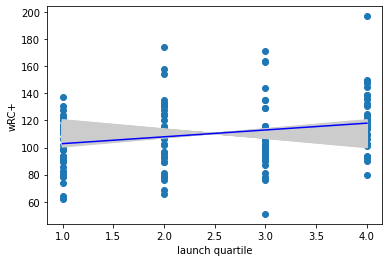

Percent of permutated regression slopes steeper than the real regression slope:  0.44999999999999996 %


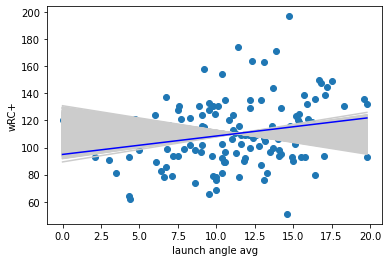

Percent of permutated regression slopes steeper than the real regression slope:  0.38999999999999996 %


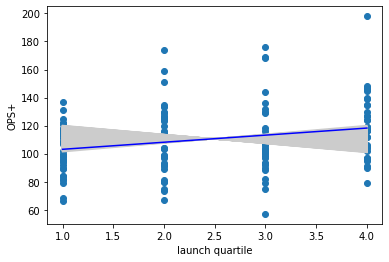

Percent of permutated regression slopes steeper than the real regression slope:  0.33999999999999997 %


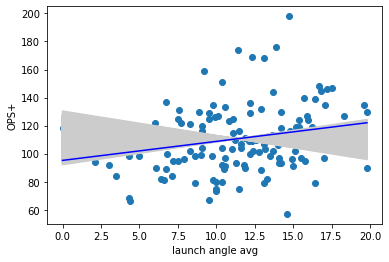

Percent of permutated regression slopes steeper than the real regression slope:  0.13999999999999999 %


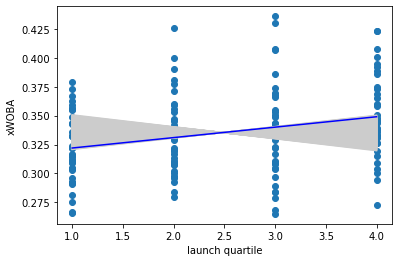

Percent of permutated regression slopes steeper than the real regression slope:  0.48 %


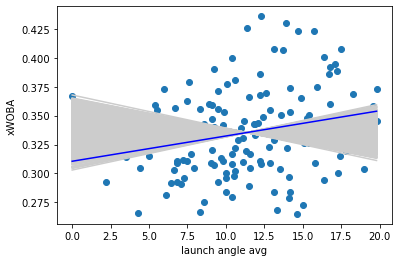

2016
Percent of permutated regression slopes steeper than the real regression slope:  0.47000000000000003 %


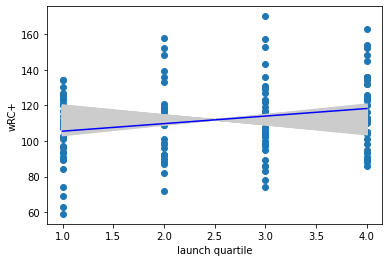

Percent of permutated regression slopes steeper than the real regression slope:  1.91 %


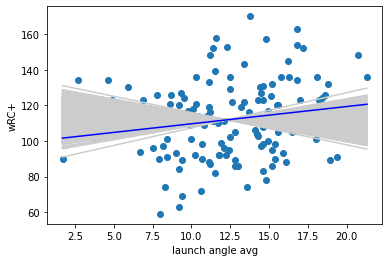

Percent of permutated regression slopes steeper than the real regression slope:  0.3 %


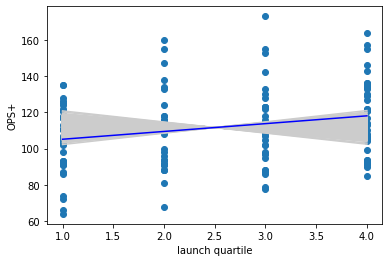

Percent of permutated regression slopes steeper than the real regression slope:  1.6500000000000001 %


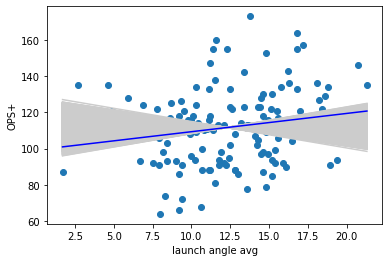

Percent of permutated regression slopes steeper than the real regression slope:  0.9199999999999999 %


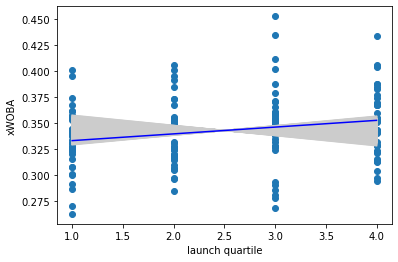

Percent of permutated regression slopes steeper than the real regression slope:  5.75 %


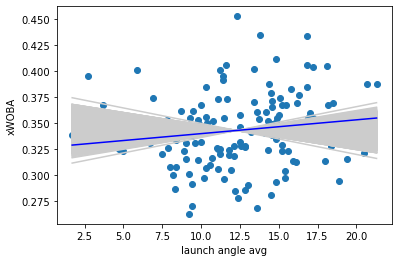

2017
Percent of permutated regression slopes steeper than the real regression slope:  1.48 %


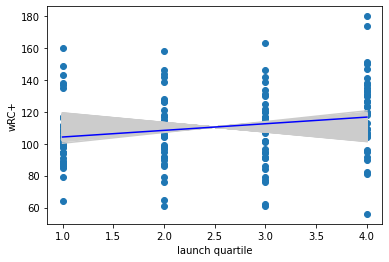

Percent of permutated regression slopes steeper than the real regression slope:  2.3 %


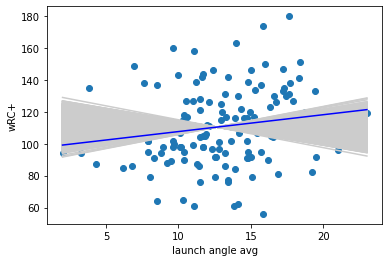

Percent of permutated regression slopes steeper than the real regression slope:  1.32 %


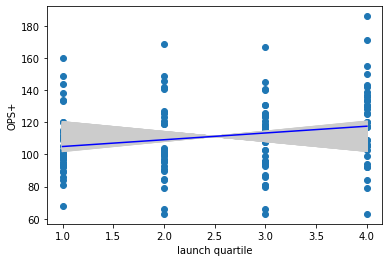

Percent of permutated regression slopes steeper than the real regression slope:  1.94 %


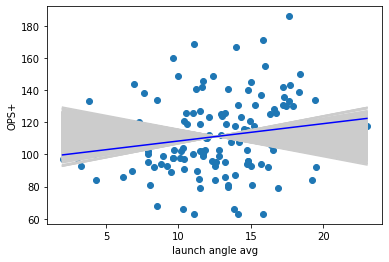

Percent of permutated regression slopes steeper than the real regression slope:  2.91 %


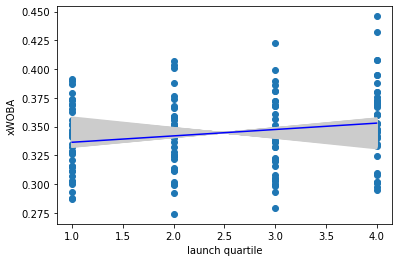

Percent of permutated regression slopes steeper than the real regression slope:  1.7999999999999998 %


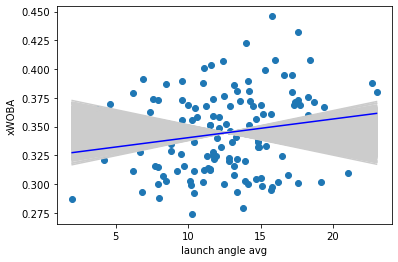

2018
Percent of permutated regression slopes steeper than the real regression slope:  2.78 %


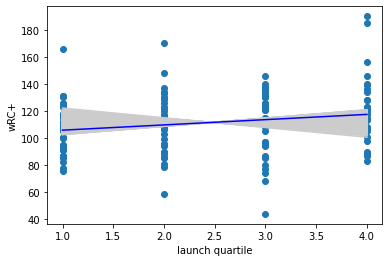

Percent of permutated regression slopes steeper than the real regression slope:  1.31 %


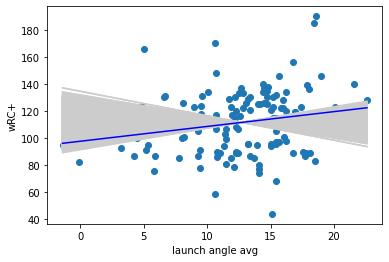

Percent of permutated regression slopes steeper than the real regression slope:  1.1900000000000002 %


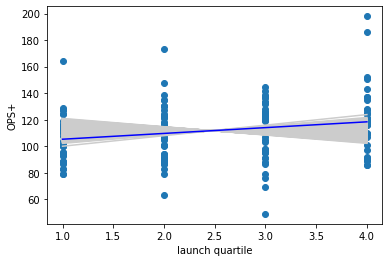

Percent of permutated regression slopes steeper than the real regression slope:  0.51 %


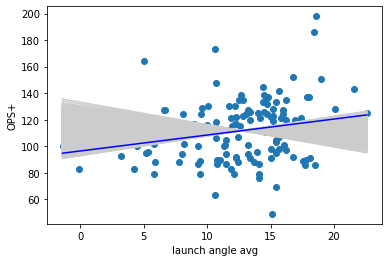

Percent of permutated regression slopes steeper than the real regression slope:  4.15 %


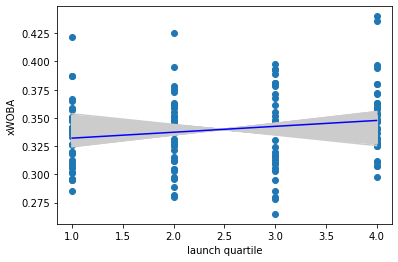

Percent of permutated regression slopes steeper than the real regression slope:  1.78 %


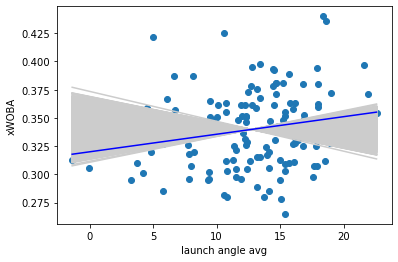

2019
Percent of permutated regression slopes steeper than the real regression slope:  0.51 %


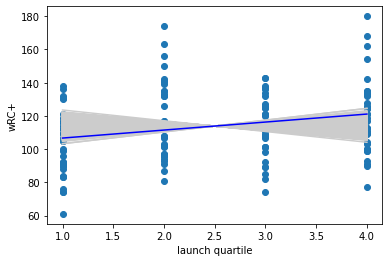

Percent of permutated regression slopes steeper than the real regression slope:  0.09 %


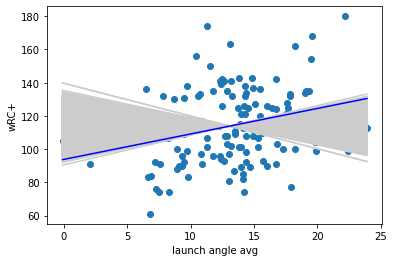

Percent of permutated regression slopes steeper than the real regression slope:  0.31 %


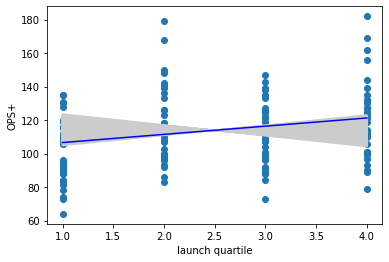

Percent of permutated regression slopes steeper than the real regression slope:  0.08 %


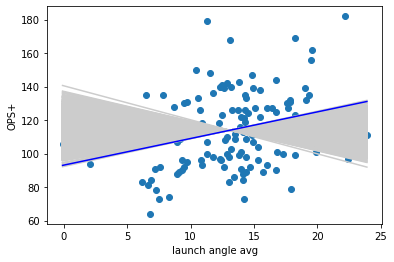

Percent of permutated regression slopes steeper than the real regression slope:  0.21 %


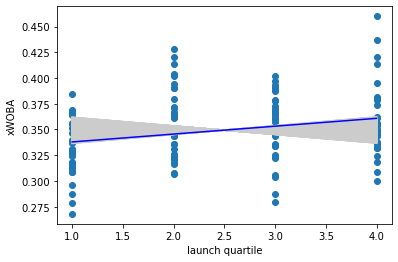

Percent of permutated regression slopes steeper than the real regression slope:  0.0 %


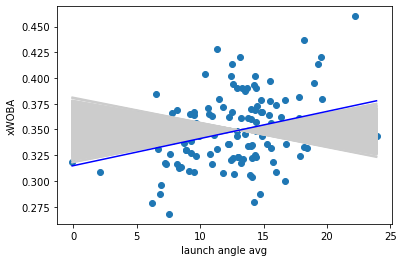

All Years Combined
Percent of permutated regression slopes steeper than the real regression slope:  0.0 %


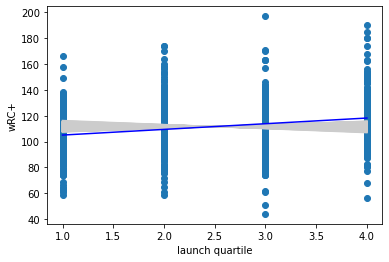

Percent of permutated regression slopes steeper than the real regression slope:  0.0 %


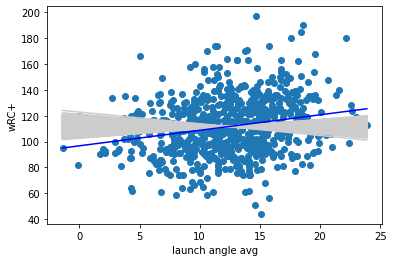

Percent of permutated regression slopes steeper than the real regression slope:  0.0 %


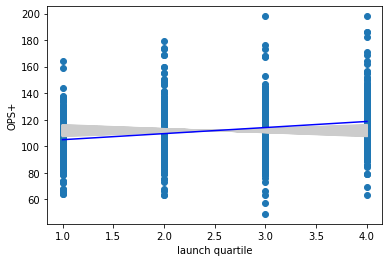

Percent of permutated regression slopes steeper than the real regression slope:  0.0 %


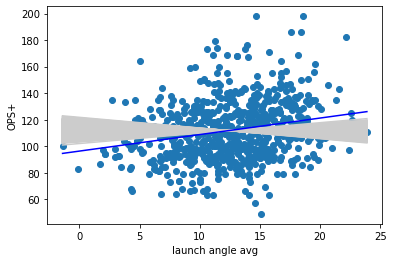

Percent of permutated regression slopes steeper than the real regression slope:  0.0 %


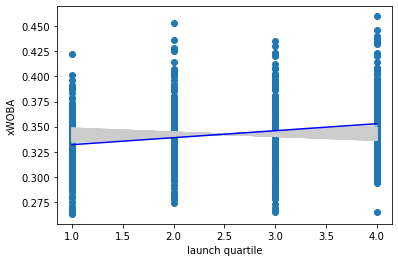

Percent of permutated regression slopes steeper than the real regression slope:  0.0 %


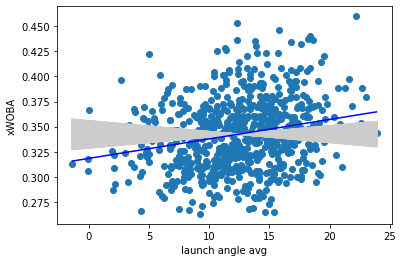

In [48]:
for i in range(5):
    print(i + 2015)
    plot_fake_vs_real_and_significance(dataframes[i][x_rows[0]], dataframes[i][y_columns[0]], dataframes[i][[x_rows[0]]], wRC_models[i], 'launch quartile', 'wRC+', np.array([1, 4]))
    plot_fake_vs_real_and_significance(dataframes[i][x_rows[1]], dataframes[i][y_columns[0]], dataframes[i][[x_rows[1]]], wRC_models_2[i], 'launch angle avg', 'wRC+', np.array([dataframes[i][x_rows[1]].min(), dataframes[i][x_rows[1]].max()]))
    
    plot_fake_vs_real_and_significance(dataframes[i][x_rows[0]], dataframes[i][y_columns[1]], dataframes[i][[x_rows[0]]], OPS_models[i], 'launch quartile', 'OPS+', np.array([1, 4]))
    plot_fake_vs_real_and_significance(dataframes[i][x_rows[1]], dataframes[i][y_columns[1]], dataframes[i][[x_rows[1]]], OPS_models_2[i], 'launch angle avg', 'OPS+', np.array([dataframes[i][x_rows[1]].min(), dataframes[i][x_rows[1]].max()]))
    
    plot_fake_vs_real_and_significance(dataframes[i][x_rows[0]], dataframes[i][y_columns[2]], dataframes[i][[x_rows[0]]], xWOBA_models[i], 'launch quartile', 'xWOBA', np.array([1, 4]))
    plot_fake_vs_real_and_significance(dataframes[i][x_rows[1]], dataframes[i][y_columns[2]], dataframes[i][[x_rows[1]]], xWOBA_models_2[i], 'launch angle avg', 'xWOBA', np.array([dataframes[i][x_rows[1]].min(), dataframes[i][x_rows[1]].max()]))

print('All Years Combined')
plot_fake_vs_real_and_significance(dataframes[5][x_rows[0]], dataframes[5][y_columns[0]], dataframes[5][[x_rows[0]]], wRC_models[5], 'launch quartile', 'wRC+', np.array([1, 4]))
plot_fake_vs_real_and_significance(dataframes[5][x_rows[1]], dataframes[5][y_columns[0]], dataframes[5][[x_rows[1]]], wRC_models_2[5], 'launch angle avg', 'wRC+', np.array([dataframes[5][x_rows[1]].min(), dataframes[5][x_rows[1]].max()]))
    
plot_fake_vs_real_and_significance(dataframes[5][x_rows[0]], dataframes[5][y_columns[1]], dataframes[5][[x_rows[0]]], OPS_models[5], 'launch quartile', 'OPS+', np.array([1, 4]))
plot_fake_vs_real_and_significance(dataframes[5][x_rows[1]], dataframes[5][y_columns[1]], dataframes[5][[x_rows[1]]], OPS_models_2[5], 'launch angle avg', 'OPS+', np.array([dataframes[5][x_rows[1]].min(), dataframes[5][x_rows[1]].max()]))
    
plot_fake_vs_real_and_significance(dataframes[5][x_rows[0]], dataframes[5][y_columns[2]], dataframes[5][[x_rows[0]]], xWOBA_models[5], 'launch quartile', 'xWOBA', np.array([1, 4]))
plot_fake_vs_real_and_significance(dataframes[5][x_rows[1]], dataframes[5][y_columns[2]], dataframes[5][[x_rows[1]]], xWOBA_models_2[5], 'launch angle avg', 'xWOBA', np.array([dataframes[5][x_rows[1]].min(), dataframes[5][x_rows[1]].max()]))

If we set our threshold for significance at 5%, then only 2018 xWOBA vs launch angle avg misses the mark and is insignificant. Because 5% is arbitrary, we can decrease that threshold to 3%, and in that case only the two xWOBA regressions from 2018 are insignificant. 22 of the 36 plots have a percent of permuted regression slopes steeper than the real regression slope under 1%, and when looking at data for all years, all of the percentages calculated were 0%: the regression slope generated from the real data was steeper than every one of the 10,000 regression slopes generated from permuting the y-values.

# Conclusions  
From these analyses, we can conclude that there is a weak positive correlation between launch angle and offensive performance. However, the regression scores being relatively low casted some doubt as to whether or not our results were significant.  
After testing the significance of our resulting slopes, I would conclude that our results were significant, as with a 5% significance threshold only 1 of the 36 tests that we performed did not show significant results, and not by much. As said before, if we decrease our threshold to 3%, only 2 of the 36 become insignificant, both xWOBA regressions from 2018. If we lower the threshold to 1%, 22 of the 36 are still significant.  
Despite our low R-Squared scores, our slopes were significant to the point that I believe there is a relationship between our offensive predictors and both launch angle average and launch quartile.  

# Weaknesses
One weakness of this analysis is that we used average launch angle as our predictor. Average launch angle is not a good statistic to use because of the different kinds of ways an average can be composed: a player could hit only fly balls and only ground balls, and a player could hit only line drives, and both could end up with the same average launch angle despite compeltely different profiles.  
A better way to determine if trying to hit the ball with a certain launch angle might be to determine how succesful the shift in philosophy, from flat or downwards swings to uppercut swings, has been. We could do this by looking at flyball%, the percent of time that a player hits the ball with a launch angle between 25 and 50 degrees, and associating this with offensive stats, or even with a statistic like xISO, which measures a player's ability to hit for power while disregarding their general hitting ability.
Another weakness of this analysis is that we limited ourselves to only using general offensive predictors, like OPS+, wRC+, and xWOBA, when it might have been better to use a wider range of statistics to see more specifically the result of an increase in launch angle is, not just looking at overall performance.

# Data Analysis OPS+

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy import stats
from scipy.stats import ttest_ind
import seaborn as sns
from statsmodels.stats.anova import anova_lm

In [2]:
data_all_years = pd.read_csv('data_all.csv', sep = ',')
data_all_years = data_all_years.drop(data_all_years.index[569])
data_all_years = data_all_years.drop(data_all_years.index[569])

In [3]:
predictors = ["exit_velocity_avg", "launch_angle_avg" ,"sweet_spot_percent", "barrels", "barrel_batted_rate", "solidcontact_percent", "flareburner_percent", "poorlyunder_percent", "poorlytopped_percent", "poorlyweak_percent", "hard_hit_percent", "z_swing_percent", "z_swing_miss_percent", "oz_swing_percent", "oz_swing_miss_percent", "oz_contact_percent", "out_zone_swing_miss", "out_zone_swing", "out_zone_percent", "out_zone", "meatball_swing_percent", "meatball_percent", "pitch_count_offspeed", "pitch_count_fastball", "pitch_count_breaking", "pitch_count", "iz_contact_percent", "in_zone_swing_miss", "in_zone_swing", "in_zone_percent", "in_zone", "edge_percent", "edge", "whiff_percent", "swing_percent", "pull_percent", "straightaway_percent", "opposite_percent", "batted_ball", "f_strike_percent", "groundballs_percent", "groundballs", "flyballs_percent", "flyballs", "linedrives_percent", "linedrives", "popups_percent", "popups", "n_bolts", "sprint_speed", "UBR"]


<ipython-input-4-8602c0d596a6>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


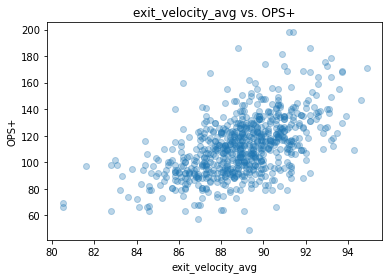

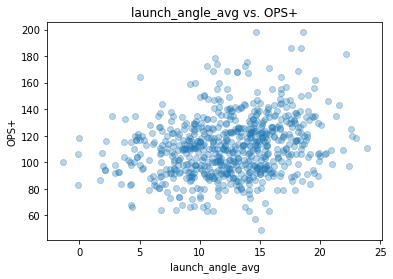

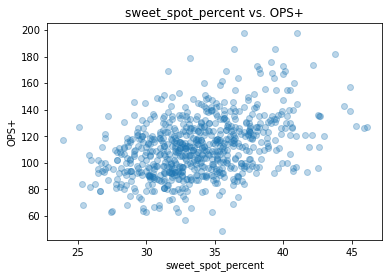

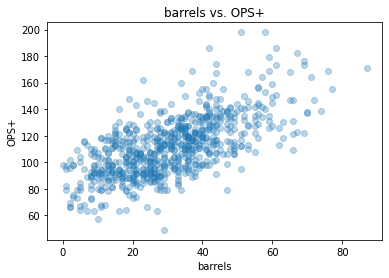

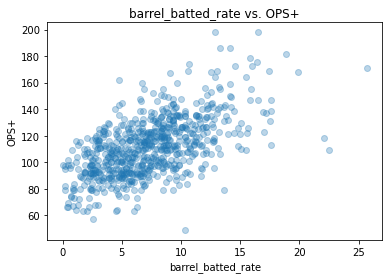

...

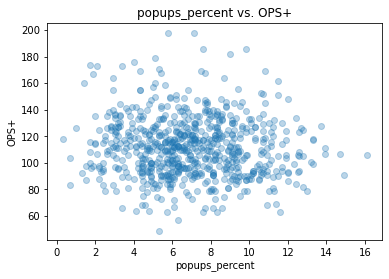

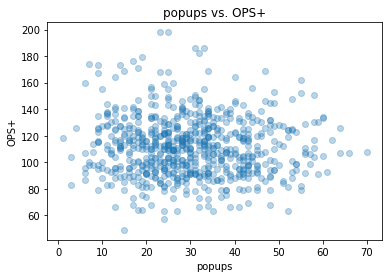

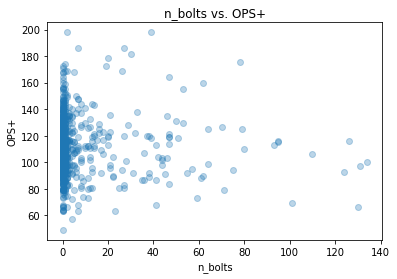

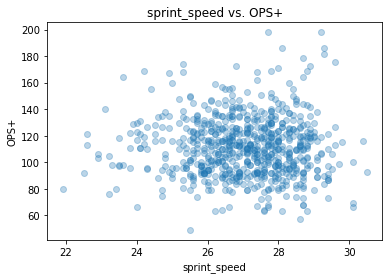

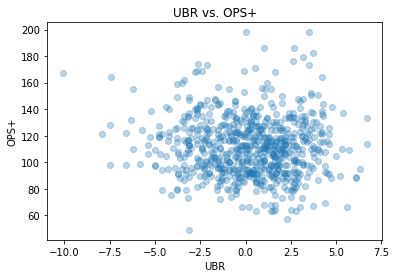

In [4]:
i = 0
for x in predictors:
  plt.figure(i)
  plt.scatter(data_all_years[x], data_all_years['OPS_Plus'],alpha = 0.3)
  plt.xlabel(x)
  plt.ylabel('OPS+')
  plt.title(x + ' vs. OPS+')
  i = i + 1

In [5]:
# Original Set of predictors
X = np.array(data_all_years[["exit_velocity_avg","launch_angle_avg","barrels", "solidcontact_percent", "poorlytopped_percent", "hard_hit_percent", "oz_swing_percent","out_zone", "pitch_count","in_zone","edge", "swing_percent", "groundballs_percent", "flyballs_percent"]])

# Evaluation of Significance OPS+

In [6]:
import statsmodels.api as sm

In [7]:
ops_plus_model = sm.OLS(data_all_years['OPS_Plus'],X)
ops_plus_model_results = ops_plus_model.fit()
print(ops_plus_model_results.pvalues)

x1     4.596582e-27
x2     2.536942e-06
x3     3.234170e-22
x4     6.678039e-01
x5     1.419493e-04
x6     1.242934e-06
x7     1.490660e-03
x8     5.464901e-01
x9     8.058829e-01
x10    8.529366e-01
x11    2.163900e-02
x12    3.058783e-01
x13    1.785953e-04
x14    2.227369e-05
dtype: float64


Based on the above p - value output, it seems that we can remove some of the predictors that are insignificant but we have to make sure this is safe to do using a one-way anova test, by testing the insignisifcant predictors against the whole model. 

From the above it seems that there are 5 insignificant predictors(based off of a minimal significance p-value threshold of 0.05 or below). These are: 

1. solidcontact_percent(with p-value = 0.6678)

2. pitch_count(with p-value = 0.5465)

3. in_zone(with p-value = 0.8059)

4. edge(with p-value = 0.8529)

5. swing_percent (with p-value = 0.3059)

In [8]:
# Make a reduced model without the above predictors

ops_plus_preds_red = np.array(data_all_years[["exit_velocity_avg","launch_angle_avg","barrels", "poorlytopped_percent", "hard_hit_percent", "oz_swing_percent","out_zone", "groundballs_percent", "flyballs_percent"]])

ops_plus_model_red = sm.OLS(data_all_years['OPS_Plus'],ops_plus_preds_red)
ops_plus_model_red_results = ops_plus_model_red.fit()

In [9]:
# Running the anova model to test whether it is ok to remove these five predictors all at once

anovatest = anova_lm(ops_plus_model_red_results, ops_plus_model_results)
print(anovatest)

   df_resid            ssr  df_diff      ss_diff         F    Pr(>F)
0     695.0  165766.208613      0.0          NaN       NaN       NaN
1     690.0  161247.660519      5.0  4518.548095  3.867093  0.001833


/Users/jonasmilano/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1932: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


From the above anova result it is apparent that there is at least one significant predictor that is contibuting to the overall model, therefore further testing has to be done via incremementally reducing the full model by one predictor and running the same comparison process until a satisfactory result is acheived. This has to be done becuase we cannot conclusively remove all 5 predictors at the same time.

In [10]:
# Second round of testing for insiginificant predictors

ops_plus_preds_red_2 = np.array(data_all_years[["exit_velocity_avg","launch_angle_avg","barrels", "poorlytopped_percent", "hard_hit_percent", "oz_swing_percent","out_zone", "pitch_count","in_zone","edge", "swing_percent", "groundballs_percent", "flyballs_percent"]])

ops_plus_model_red_2 = sm.OLS(data_all_years['OPS_Plus'],ops_plus_preds_red_2)
ops_plus_model_red_results_2 = ops_plus_model_red_2.fit()

print(ops_plus_model_red_results_2.tvalues)
print(ops_plus_model_red_results_2.pvalues)

x1     11.245831
x2     -4.730498
x3     10.290776
x4     -3.804685
x5     -5.539682
x6     -3.175103
x7      0.575966
x8      0.265576
x9     -0.214650
x10    -2.276699
x11    -1.077820
x12    -3.745986
x13    -4.430098
dtype: float64
x1     4.621825e-27
x2     2.716547e-06
x3     3.318409e-23
x4     1.545666e-04
x5     4.310413e-08
x6     1.564368e-03
x7     5.648259e-01
x8     7.906447e-01
x9     8.301036e-01
x10    2.310917e-02
x11    2.814902e-01
x12    1.946749e-04
x13    1.094903e-05
dtype: float64


In [11]:
anovatest = anova_lm(ops_plus_model_red_results_2, ops_plus_model_results)
print(anovatest)

   df_resid            ssr  df_diff  ss_diff        F    Pr(>F)
0     691.0  161290.739318      0.0      NaN      NaN       NaN
1     690.0  161247.660519      1.0  43.0788  0.18434  0.667804


/Users/jonasmilano/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1932: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


As it turns out there seems to be at least one other predictor which is causing the model to be insignificant, so we will proceed as above, and remove one more insignificant predictor, in this case it will be "out_zone" with a large p-value of 0.5648.

We will create another reduced model without this predictor and instead of comparing to the original full model, we will use the above, ops_plus_preds_red_2 model as the "full" model. 

In [12]:
ops_plus_preds_red_3 = np.array(data_all_years[["exit_velocity_avg","launch_angle_avg","barrels", "poorlytopped_percent", "hard_hit_percent", "oz_swing_percent", "pitch_count","in_zone","edge", "swing_percent", "groundballs_percent", "flyballs_percent"]])

ops_plus_model_red_3 = sm.OLS(data_all_years['OPS_Plus'],ops_plus_preds_red_3)
ops_plus_model_red_results_3 = ops_plus_model_red_3.fit()

print(ops_plus_model_red_results_3.tvalues)
print(ops_plus_model_red_results_3.pvalues)

x1     11.292204
x2     -4.728677
x3     10.353022
x4     -3.789595
x5     -5.549224
x6     -3.133861
x7      3.834110
x8     -2.954288
x9     -2.208805
x10    -1.103730
x11    -3.799642
x12    -4.594449
dtype: float64
x1     2.941861e-27
x2     2.739512e-06
x3     1.882599e-23
x4     1.640392e-04
x5     4.089123e-08
x6     1.798105e-03
x7     1.375104e-04
x8     3.240279e-03
x9     2.751513e-02
x10    2.700938e-01
x11    1.576605e-04
x12    5.156068e-06
dtype: float64


In [13]:
anovatest = anova_lm(ops_plus_model_red_results_3, ops_plus_model_red_results_2)
print(anovatest)

   df_resid            ssr  df_diff   ss_diff         F    Pr(>F)
0     692.0  161368.172048      0.0       NaN       NaN       NaN
1     691.0  161290.739318      1.0  77.43273  0.331736  0.564826


/Users/jonasmilano/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1932: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Looks like there is still at least one predictor that is still insignificant so we will proceed with another round of testing while also removing the "swing_percent" predictor with a  p-value of 0.2700. Just like in the second trial through, we will create a new reduced model and compare to ops_plus_preds_red_3. 

In [14]:
ops_plus_preds_red_4 = np.array(data_all_years[["exit_velocity_avg","launch_angle_avg","barrels", "poorlytopped_percent", "hard_hit_percent", "oz_swing_percent", "pitch_count","in_zone","edge", "groundballs_percent", "flyballs_percent"]])

ops_plus_model_red_4 = sm.OLS(data_all_years['OPS_Plus'],ops_plus_preds_red_4)
ops_plus_model_red_results_4 = ops_plus_model_red_4.fit()

print(ops_plus_model_red_results_4.tvalues)
print(ops_plus_model_red_results_4.pvalues)

x1     11.478405
x2     -4.685093
x3     10.320959
x4     -3.718932
x5     -5.438459
x6     -7.224670
x7      4.069550
x8     -3.323442
x9     -2.158075
x10    -3.876696
x11    -4.759979
dtype: float64
x1     4.832395e-28
x2     3.368870e-06
x3     2.502811e-23
x4     2.162440e-04
x5     7.456829e-08
x6     1.327888e-12
x7     5.252663e-05
x8     9.358959e-04
x9     3.126486e-02
x10    1.159506e-04
x11    2.357891e-06
dtype: float64


In [15]:
anovatest = anova_lm(ops_plus_model_red_results_4, ops_plus_model_red_results_3)
print(anovatest)

   df_resid            ssr  df_diff     ss_diff        F    Pr(>F)
0     693.0  161652.250092      0.0         NaN      NaN       NaN
1     692.0  161368.172048      1.0  284.078044  1.21822  0.270094


/Users/jonasmilano/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1932: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Removing "swing_percent" was not enough and as a result it seems that there is still some insignificance, so we will repeat the above process, and create a new reduced model by removing "edge." Hopefully this will yield a significant result.

In [16]:
ops_plus_preds_red_5 = np.array(data_all_years[["exit_velocity_avg","launch_angle_avg","barrels", "poorlytopped_percent", "hard_hit_percent", "oz_swing_percent", "pitch_count","in_zone", "groundballs_percent", "flyballs_percent"]])

ops_plus_model_red_5 = sm.OLS(data_all_years['OPS_Plus'],ops_plus_preds_red_5)
ops_plus_model_red_results_5 = ops_plus_model_red_5.fit()

print(ops_plus_model_red_results_5.tvalues)
print(ops_plus_model_red_results_5.pvalues)

x1     11.382162
x2     -4.637657
x3     10.542717
x4     -3.708513
x5     -5.390924
x6     -6.975627
x7      3.810940
x8     -4.073068
x9     -3.853809
x10    -4.786351
dtype: float64
x1     1.219264e-27
x2     4.211481e-06
x3     3.311099e-24
x4     2.251300e-04
x5     9.617008e-08
x6     7.114629e-12
x7     1.507309e-04
x8     5.174968e-05
x9     1.270808e-04
x10    2.076459e-06
dtype: float64


In [17]:
anovatest = anova_lm(ops_plus_model_red_results_5, ops_plus_model_red_results_4)
print(anovatest)

   df_resid            ssr  df_diff     ss_diff         F    Pr(>F)
0     694.0  162738.629252      0.0         NaN       NaN       NaN
1     693.0  161652.250092      1.0  1086.37916  4.657286  0.031265


/Users/jonasmilano/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1932: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


After numeroud rounds of comparing and testing we have finally come up with a fully significant, 10 predictor model as shown below.

Final Model:

OPS_Plus ~ exit_velocity_avg + launch_angle_avg + barrels + poorlytopped_percent + hard_hit_percent + oz_swing_percent + pitch_count + in_zone + groundballs_percent + flyballs_percent

# Interpretations and Conclusions OPS+
When looking at the scatterplots for OPS+ in relation to the other predictors, we found a good number that we thought resembled some sort of pattern(either/negative or positive) which ended up giving us the largest starting model in comparison to the other offensive statistics we ran regresssions on. The original model had 14 predictors, of which 4 ended up being removed after testing.

After numerous anova tests used for comparing full models with insignificant predictors to reduced models without them, we ended up removing solidcontact_percent, out_zone, edge, and swing percent. The remaining 10 predictors all had a significant relationship to OPS+.
Since OPS+ is an offensive statistic, we were not surprised by the significance of barrels, launch_angle_avg, exit_velocity_avg, or hard_hit_percent as these are all extremely batting heavy stats that in most cases are used to determine the OPS+ of a player in some way. Although we were surpised at first by some of the predictors that measured poor hits or undesirable contact, we realized that stats like poorlytopped_percent(measures dink grounders), oz_swing_percent(measures bad swings out of the zone), in_zone(measures jammed swings), groundballs_percent(measures percent of ABs resulting in ground balls), and flyballs_percent(measures percent of ABs that result in fly balls) all had a negative effect on OPS+ once we looked at the coefficients and t-values. As a result these were all signs that the model was doing the right thing.

However, we were quite surpirsed with some of the other predictors and their effect on OPS+. This was especially true for luanch_angle_avg, and hard_hit_percent. At first, we did not really understand how a metric so different from OPS+ like launch_angle_avg which is measured in degrees had any significance to OPS+, and moreover that it had a negative effect. Yet, after a bit of analysis we figured that this relationship made sense as on average lower launch angles(13-20 being the sweet spot) produced harder and better hits. So players with lower launch angles should reasonably have a better OPS+. Althogh the significance of hard_hit_percent did not really phase us, once we looked at its effect on OPS+, we were quite perplexed. Reasonably one would thing that a batter who has a higher percentage of hard hit balls would have a higher OPS+ but apparently the inverse was true. Thinking of reasosns for why this was the case proved to be a challenege but we figured that maybe the batters who had high hard_hit_percent values had lots of hard grounders or fly balls that ended up resulting in an out, therefore the lower percentage players had fewer hard hits but more quality hits that resulted in singles,doubles or better, which would then legitimze the effect on OPS+.

Overall, we had to wrangle a bit with this model especailly when going through the process of eliminating some predictors, howver we feel confident with the 10 predictor result.

# Data Analysis UBR

In [28]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy import stats
from scipy.stats import ttest_ind
import seaborn as sns
from statsmodels.stats.anova import anova_lm

In [19]:
data_all_years = pd.read_csv('data_all.csv', sep = ',')
data_all_years = data_all_years.drop(data_all_years.index[569])
data_all_years = data_all_years.drop(data_all_years.index[569])

In [20]:
predictors = ["exit_velocity_avg", "launch_angle_avg" ,"sweet_spot_percent", "barrels", "barrel_batted_rate", "solidcontact_percent", "flareburner_percent", "poorlyunder_percent", "poorlytopped_percent", "poorlyweak_percent", "hard_hit_percent", "z_swing_percent", "z_swing_miss_percent", "oz_swing_percent", "oz_swing_miss_percent", "oz_contact_percent", "out_zone_swing_miss", "out_zone_swing", "out_zone_percent", "out_zone", "meatball_swing_percent", "meatball_percent", "pitch_count_offspeed", "pitch_count_fastball", "pitch_count_breaking", "pitch_count", "iz_contact_percent", "in_zone_swing_miss", "in_zone_swing", "in_zone_percent", "in_zone", "edge_percent", "edge", "whiff_percent", "swing_percent", "pull_percent", "straightaway_percent", "opposite_percent", "batted_ball", "f_strike_percent", "groundballs_percent", "groundballs", "flyballs_percent", "flyballs", "linedrives_percent", "linedrives", "popups_percent", "popups", "n_bolts","sprint_speed"]

<ipython-input-21-37e0afabcbe7>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


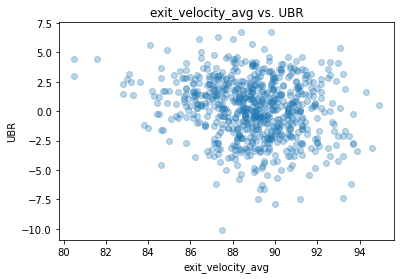

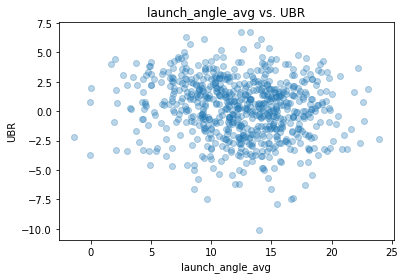

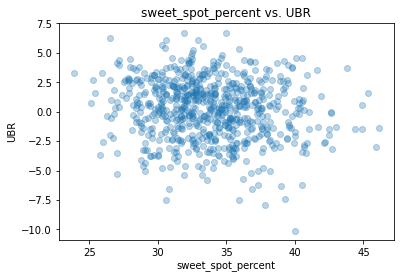

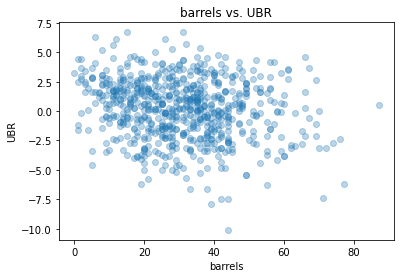

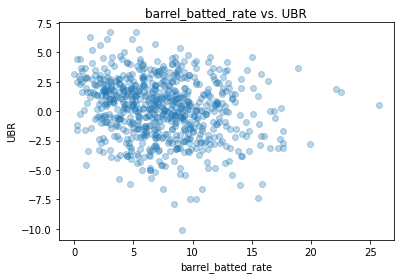

...

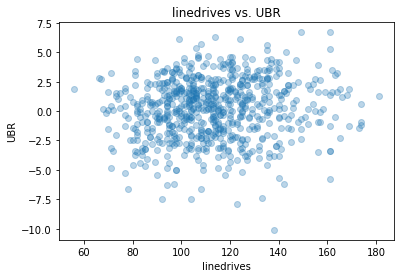

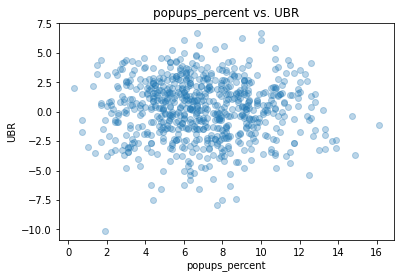

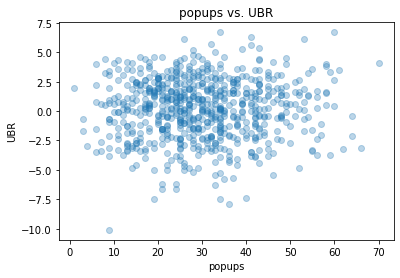

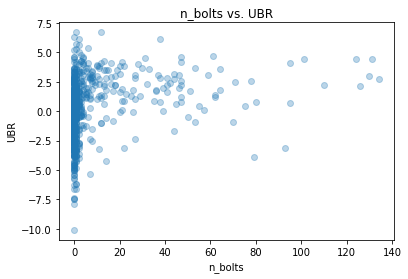

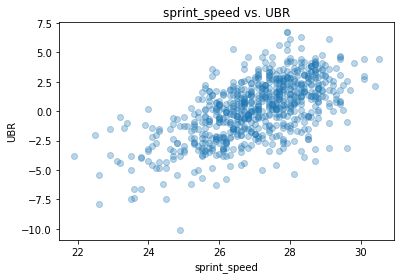

In [21]:
i = 0
for x in predictors:
  plt.figure(i)
  plt.scatter(data_all_years[x], data_all_years['UBR'],alpha = 0.3)
  plt.xlabel(x)
  plt.ylabel('UBR')
  plt.title(x + ' vs. UBR')
  i = i + 1

In [47]:
# Original set of predictors UBR

X = np.array(data_all_years[["exit_velocity_avg","barrels","solidcontact_percent","in_zone_percent","n_bolts","sprint_speed"]])

# Evaluation of Significance UBR

In [43]:
import statsmodels.api as sm

Based on the above p - value output, it seems that there are a few insignificant predictors(based off of a minimal significance p-value threshold of 0.05 or below). These insignificant predictors are:

barrels(with p-value = 0.1140)

solidcontact_percent(with p-value = 0.8090)

in_zone_percent(with p-value = 0.5119)



In [45]:
# Make a reduced model without the above predictors

ubr_preds_red = np.array(data_all_years[["exit_velocity_avg","n_bolts","sprint_speed"]])

ubr_model_red = sm.OLS(data_all_years['UBR'],ubr_preds_red)
ubr_model_red_results = ubr_model_red.fit()

In [46]:
# Running the anova model to test whether it is ok to remove this predictor

anovatest = anova_lm(ubr_model_red_results, ubr_model_results)
print(anovatest)

   df_resid           ssr  df_diff     ss_diff             F  Pr(>F)
0     701.0  2.980969e+03      0.0         NaN           NaN     NaN
1     698.0  9.867085e-27      3.0  2980.96879  7.029148e+31     0.0


/Users/jonasmilano/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1932: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Since the above output yields a p-vlaue above our threshold of 0.05, we will remove the insignificant predictors "barrels","solidcontact_percent",and "in_zone_percent" as these are not adding anything to the full model.

Final Model:

UBR ~ exit_velocity_avg + n_bolts + sprint_speed

# Interpretations and Conclusions UBR


Although there is a possibility that the model could be underfitted, from the scatterplots alone, this is probabaly not the case.
When building the model we looked at the scatterplots and added predictors based on whethern we saw some sort of pattern(either negative or positive) in the plot. Therefore, we ended up adding a total of 6 predictors to the original model based on the patterns we saw in the plots.

However, after running the appropriate tests for significance and ensuring the predictors were all significant, we ended up eliminating 3 of the 6 predictors and only keeping "exit_velocity" , "n_bolts" , and "sprint_speed" which coincidentally were also the only predictors with very strong association to UBR in the plots. Therefore, the other predictors that were discarded resembled some sort of positive/negative asssociation in the graph, however the fact that there was any subtlty rendered these predictors insignificant, therefore we feel that this is an accurate model depicting UBR as it includes the predictors that influence it the most.

Based on the results, it is apparent that UBR is heavily influenced by the two other base running statistics which are n_bolts(), and sprint_speed(measurinf how fast the player runs). This was no surprise and was a welcomed sight as we would expect running stats to associate strongly with a base running statistic such as UBR, further reaffirming the model's strength. However, we were surprised by the significance of the exit_velocity_avg stat on UBR. Initially, it may not seem that the ball's exit velocity off of a player's bat has significance, but considering many balls that are hit with a high velocity are line drives, or homeruns it is not totally impossible to think that players with high exit velocities will be pressured to cover more bases and run faster to get as close to home as possible, so it is validly significant.

Therefore, we have our significant control predictors of sprint_speed and n_bolts to ensure the model is correct, but we were alsos surprised and interested in the fact that higher exit velocities might also impact UBR in a positive way as player who get harder hits may end up reaching more bases with their speed.

# Data Analysis Sprint Speed

In [29]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy import stats
from scipy.stats import ttest_ind
import seaborn as sns
from statsmodels.stats.anova import anova_lm

In [30]:
data_all_years = pd.read_csv('data_all.csv', sep = ',')
data_all_years = data_all_years.drop(data_all_years.index[569])
data_all_years = data_all_years.drop(data_all_years.index[569])

In [31]:
predictors = ["exit_velocity_avg", "launch_angle_avg" ,"sweet_spot_percent", "barrels", "barrel_batted_rate", "solidcontact_percent", "flareburner_percent", "poorlyunder_percent", "poorlytopped_percent", "poorlyweak_percent", "hard_hit_percent", "z_swing_percent", "z_swing_miss_percent", "oz_swing_percent", "oz_swing_miss_percent", "oz_contact_percent", "out_zone_swing_miss", "out_zone_swing", "out_zone_percent", "out_zone", "meatball_swing_percent", "meatball_percent", "pitch_count_offspeed", "pitch_count_fastball", "pitch_count_breaking", "pitch_count", "iz_contact_percent", "in_zone_swing_miss", "in_zone_swing", "in_zone_percent", "in_zone", "edge_percent", "edge", "whiff_percent", "swing_percent", "pull_percent", "straightaway_percent", "opposite_percent", "batted_ball", "f_strike_percent", "groundballs_percent", "groundballs", "flyballs_percent", "flyballs", "linedrives_percent", "linedrives", "popups_percent", "popups", "n_bolts", "UBR"]

<ipython-input-32-591e4abf9182>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


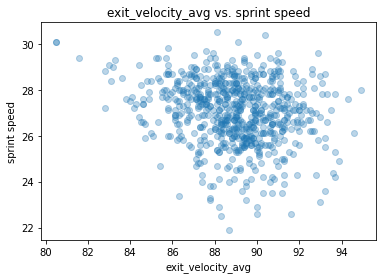

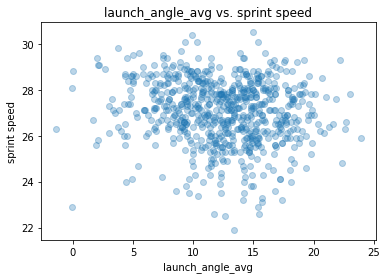

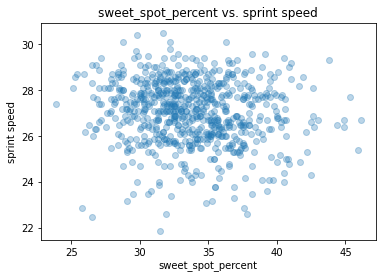

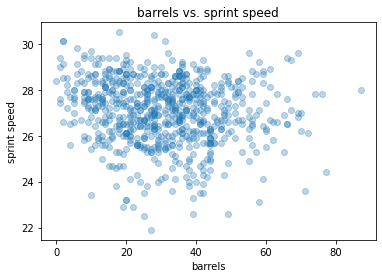

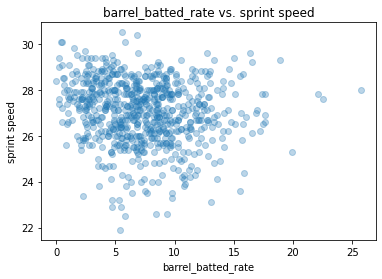

...

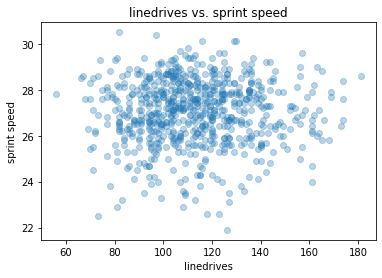

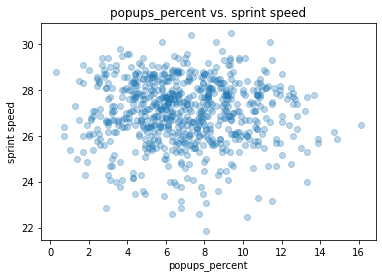

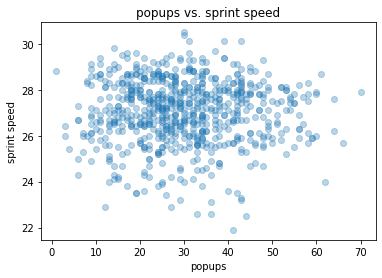

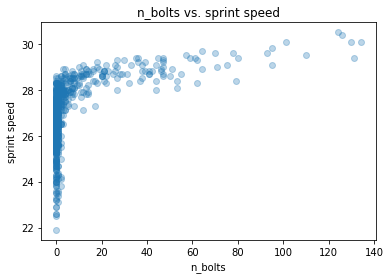

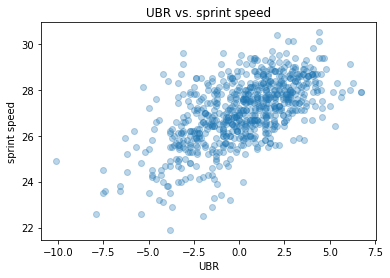

In [32]:
i = 0
for x in predictors:
  plt.figure(i)
  plt.scatter(data_all_years[x], data_all_years['sprint_speed'],alpha = 0.3)
  plt.xlabel(x)
  plt.ylabel('sprint speed')
  plt.title(x + ' vs. sprint speed')
  i = i + 1

In [33]:
# Original predictor set

X = np.array(data_all_years[["solidcontact_percent","barrels","flyballs_percent", "f_strike_percent","n_bolts", "UBR"]])

# Evaluation of Significance Sprint Speed

In [39]:
import statsmodels.api as sm

In [40]:
ss_model = sm.OLS(data_all_years['sprint_speed'],X)
ss_model_results = ss_model.fit()
print(ss_model_results.tvalues)
print(ss_model_results.pvalues)

x1     2.153310
x2     1.669382
x3     6.832181
x4    83.453149
x5     8.198829
x6    10.547468
dtype: float64
x1    3.163620e-02
x2    9.549012e-02
x3    1.823224e-11
x4    0.000000e+00
x5    1.163428e-15
x6    3.103062e-24
dtype: float64


Based on the above p - value output, it seems that all but the second predictor are signidficant(based off of a minimal significance p-value threshold of 0.05 or below). This insignificant predictor is:

barrels(with p-value = 0.0955)

In [41]:
# Make a reduced model without the above predictor

ss_preds_red = np.array(data_all_years[["solidcontact_percent","flyballs_percent", "f_strike_percent","n_bolts", "UBR"]])

ss_model_red = sm.OLS(data_all_years['sprint_speed'],ss_preds_red)
ss_model_red_results = ss_model_red.fit()

In [42]:
# Running the anova model to test whether it is ok to remove this predictor

anovatest = anova_lm(ss_model_red_results, ss_model_results)
print(anovatest)

   df_resid          ssr  df_diff   ss_diff         F   Pr(>F)
0     699.0  1716.754130      0.0       NaN       NaN      NaN
1     698.0  1709.927073      1.0  6.827057  2.786836  0.09549


/Users/jonasmilano/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1932: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Since the above output yields a p-vlaue above our threshold of 0.05, we will remove the insignificant predictor "barrels" as it is not adding anything to the model.

Final Model:

sprint_speed ~ solidcontact_percent + flyballs_percent + f_strike_percent + n_bolts + UBR

# Interpretations and Conclusions Sprint Speed

After looking at the scatterplots and coming to a consensus on which predictors to include based on the information the scatterplots provided, we ended up with 6 predictor model initially.

Although were on the fence about some of the predictors such as "barrels" and "flyballs_percent", due to the fact that their scatterplots showed a very weak associatio to sprint speed, we endded up removing "barrels" after using an anova comparison test. Therfore we ended up with a 5 predicot final model that told us "solidcontact_percent","flyballs_percent", "f_strike_percent", "n_bolts", and "UBR" significntly impacted sprint_speed.

Although we were not surpirsed, and welcomed the signficance of n_bolts and UBR as they are both running stats, we were intrigued as to why there was a significant association between the other three predictors.

We figured that for both solidcontact_percent and flyballs_percent the player would be inclined to run faster as well as satisfy some of the criteria needed for a better UBR score. On a hard hit ball the player would want to advance as much as possible and get as close to home as he could, and on the flipside, the player who would hit a fluball would be inclined to run fast to the gain as many bases as possible in case the ball lands in a gap or an outfielder misses it.

However, the odd ball ended up being the f_strike_percent predictor which details the percent of a player's at bats where they take the first strike. Besides some situational reasons that would cause a player who happened to be fast, to intentionally take the first strike, it was tough to come up with a conclusion on why a player with a higher first pitch strike percent would have a higher sprint speed. One reason that may contribute to this relationship however may be that the player could get down in the count and will end up trying to get to first on a drop third, or one reason could be that players who are faster in general take the first pitch for a strike or just arent as aggressive in the box.
Overall we ended up with a 5 predictor model that we feel significantly resembles the relationship between player speed and offensive characteristics.

# Potential Weaknesses of Each Model
One of the biggest limitations(and this applies for all the models) is that we are basing the potential significance of the predictors solely on what we see from the scatterplots. 

An example of how this can be problematic can beseen in the UBR model by the addition of n_bolts to the UBR model. From the plot, it is really hard to tell whether or not n_bolts would be a significant predictor, however due to the fact that it is a base running statistic, we ended up adding it into the model due to intuition, as it turns out it was quite a significant predictor. 

Therefore, if we were to add/not add predictors to a model based solely on the scatterplots we may end up leaving out some key predictors, or create more work for ourselves by needing to remove insignificant predictors from the model which looked good in the plots. Therefore, we may be able to get a better understanding of the significance of each predictor by running all of them through some sort of model building procedure that evaluates each facet of the predictors relation to the response variable and comes out wuth a comprehensive list of what predictors are/arent contributing to the response.

We could be missing some predictors/stats which could better explain the response variables that are either not in the data_all dataset or not in the model becuase they did not look significant from the scatterplots(see above). Moreover, we did not check for the possibility of greater significance by the addition of polynomial terms or check for interaction terms, which could help in creating a stronger, more precise model.

Lastly, many of the statistics have different or arbitrary values determined by a specific set of events or have different units than other predictors/ the response which means that we may not be able to compare correlation coefficients acorss prredictors and/or analyze their effect on the response variable without first understanding the context and relation of the units.



# Limitations
1. Statcast data only exists back to 2015, so by using Statcast data we limit the time frame of our analysis. Baseball records date back to 1871, and there are complete records dating back to the early 1900s. Having suvh a wealth of data would allow us to be more sure in any conclusions we make, and would also allow us to show trends over time.
2. By limiting our sample set of player-years to only qualified batters, we have under 150 player-years per year. Although this number seems large, it is around 1/10 of the full player-years that exist each year in MLB. It is good that we are only looking at sufficiently large samples, but it would be better if we had more data available.
3. Not all batters qualify in all five years, limiting further our ability to track trends over multiple years. Only a limited number of batters appear in all 5 years of the data that we have, so this limits our ability further in tracking trends year by year, and projecting a player's performance in the next year, because they might not exist in that next year of data.
4. For some of the Statcast data that measures quality of contact (solidcontact_percent), the methodology behind the creation of the stat does not exist publically, in our research. Although we understand that solid contact probably refers to a range of exit velocity from around 85 to 95 mph, we cannot say this for sure, and therefore should not draw conclusions from this statistic.

# Source Code

## https://github.com/GeoffreyBrann/info2950



# Acknowledgements

statsmodel.api package  
Professor Mimno's 10/29 and 11/3 lectures: We used two of the techniques (and a lot of the code) he showed to test the significance of the launch angle regressions we performed.

# Questions for Reviewers

1. Are we putting too much stuff in the notebook? Is it too cluttered to read? Anything that we should remove/add?
2. Was anything confusing or not explained to the extent it should have been?
3. Were our conclusions sufficient? Or did we not explain sufficiently?

# Appendix
### Data Cleaning Description

### Goal: Move all 3 csvs into DataFrames, clean them so they all contain the same player-years and are sorted with the same player-years in the same indices, and append 3 columns from the non-Statcast DataFrames onto the Statcast DataFrame to create one DataFrame with all of our statistics of interest.<br>

### Step by step (2015_batter_OPS+.csv, 2016_batter_OPS+.csv, 2017_batter_OPS+.csv, 2018_batter_OPS+.csv, 2019_batter_OPS+.csv)<br>
1. Import data into a DataFrame<br>
2. Change the “OPS+” column name to “OPS_Plus”<br>
3. Eliminate most duplicates by only retaining players with over 502 Plate Appearances (qualified batters)<br>
4. Reset the index<br>
5. Get rid of all the columns in the dataset except for “Name” and “OPS_Plus”<br>
6. Got rid of the row containing league average statistics and any remaining redundant players (who might have been qualified at a single team and then have been traded, elaborated in Manual Cleaning part 3)<br>
7. Reset the index again, and dropped the ‘index’ column<br>
8. Name column (which contains both first and last name in one column) was changed to only contain the last name of the player, using a function that parsed the name column for a space and deleted everything preceding that space.<br>
a. Only 2019_batter_OPS+.csv was not already sorted alphabetically and necessitated this step<br>
9. Sorted by last name alphabetically<br><br>

### Step by step (UBR_wRC+_data_2015-2019.csv, for UBR data)<br>
1. Import data into a DataFrame<br>
2. Dropped all the columns except for “Name” and “UBR”<br>
3. Name column (which contains both first and last name in one column) was changed to only contain the last name of the player, using a function that parsed the name column for a space and deleted everything preceding that space.<br>
4. Sort to be alphabetical by last name<br>
5. Reset index, dropped index column<br><br>
### Step by step (UBR_wRC+_data_2015-2019.csv, for wRC+ data)<br>
1. Import data into a DataFrame<br>
2. Dropped all the columns except for “Nam”e and “wRC+”<br>
3. Changed name of “wRC+” column to “wRC_Plus”<br>
4. Name column (which contains both first and last name in one column) was changed to only contain the last name of the player, using a function that parsed the name column for a space and deleted everything preceding that space.<br>
5. Sort to be alphabetical by last name<br>
6. Reset index, dropped index column<br><br>
### Step by step (Statcast_stats_2015-2019.csv)<br>
1. Import into DataFrame<br>
2. Drop ‘Unnamed: 59’ column<br>
3. Rename ‘ first_name’ to ‘first_name’ (removed a leading space)<br>
4. Sorted by ‘last_name’<br>
5. Reset the index<br>
6. Dropped the index column<br>
7. Append DataFrames containing OPS_Plus data onto the Statcast DataFrame<br>
8. Changed “Name” column originally from the DataFrame containing OPS_Plus data to be ‘OPS_Plus_Name’<br>
9. Append DataFrames containing wRC_Plus data onto the Statcast DataFrame<br>
10. Changed “Name” column originally from the DataFrame containing wRC_Plus and UBR data to be ‘wRC_Plus_Name’<br>
11. Append DataFrames containing UBR data onto the Statcast DataFrame<br>
12. Changed “Name” column originally from the DataFrame containing wRC_Plus and UBR data to be ‘UBR_Name’<br><br>

### Manual Cleaning
For 2015_batter_OPS+.csv, 2016_batter_OPS+.csv, 2017_batter_OPS+.csv, 2018_batter_OPS+.csv, 2019_batter_OPS+.csv, UBR_wRC+_data_2015-2019.csv<br>

1.	In the case when you have two of the same last name: (this is a problem when we dropped first names)
a.	Sometimes when you drop the first names from the “Name” column (detailed above), and then sort the DataFrame alphabetically, the DataFrame will become alphabetized in a different way (Player A and B with the same last name might have indices 35 and 36 in one DataFrame, and indices 36 and 35 in a different DataFrame). than the Statcast DataFrame. We had to go through every duplicate last name individually and determine if they were in the correct corresponding order, and if they were not, switch the order of the rows so that when we appended columns onto the final DataFrame, all of the statistics were correctly ordered.

For UBR_wRC+_data_2015-2019.csv<br>

2. Dee Strange-Gordon in 2015, 2017, and 2018. The UBR and wRC+ data had his name formatted as “Dee Strange- Gordon” (with a space between the hyphen and Gordon), so when all of the first names were cut off, ‘Dee Strange-‘ was cut off as well, leaving only Gordon. To fix this, we reindexed the Statcast and OPS+ so that Dee Stange-Gordon was below Alex Gordon, where it appeared in the wRC+ and UBR data. This meant the final DataFrame was not in alphabetical order anymore, due to Dee (S)trange-Gordon appearing directly below Alex (G)ordon

For 2015_batter_OPS+.csv, 2016_batter_OPS+.csv, 2017_batter_OPS+.csv, 2018_batter_OPS+.csv, 2019_batter_OPS+.csv<br>

3. In the case where a player accumulated 502 PA with a single team and then was traded, in the OPS+ data you would get a duplicate player row, one denoted by TOT (total season) and one row cotaining their stats for that one specific team. We dropped the player-year with the specific team and keep the player-year with TOT.



## Other appendices

### Exploratory Data Analysis

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [52]:
data_2019 = pd.read_csv('2019_statcast_data_final.csv')

In [53]:
data_2018 = pd.read_csv('2018_statcast_data_final.csv')

In [54]:
data_2017 = pd.read_csv('2017_statcast_data_final.csv')

In [55]:
data_2016 = pd.read_csv('2016_statcast_data_final.csv')

In [56]:
data_2015 = pd.read_csv('2015_statcast_data_final.csv')
data_2015 = data_2015.drop('hp_to_1b',axis=1)

In [57]:
#All variables
data_2019.columns

Index(['last_name', 'first_name', 'year', 'xba', 'xslg', 'xwoba', 'xobp',
       'xiso', 'exit_velocity_avg', 'launch_angle_avg', 'sweet_spot_percent',
       'barrels', 'barrel_batted_rate', 'solidcontact_percent',
       'flareburner_percent', 'poorlyunder_percent', 'poorlytopped_percent',
       'poorlyweak_percent', 'hard_hit_percent', 'z_swing_percent',
       'z_swing_miss_percent', 'oz_swing_percent', 'oz_swing_miss_percent',
       'oz_contact_percent', 'out_zone_swing_miss', 'out_zone_swing',
       'out_zone_percent', 'out_zone', 'meatball_swing_percent',
       'meatball_percent', 'pitch_count_offspeed', 'pitch_count_fastball',
       'pitch_count_breaking', 'pitch_count', 'iz_contact_percent',
       'in_zone_swing_miss', 'in_zone_swing', 'in_zone_percent', 'in_zone',
       'edge_percent', 'edge', 'whiff_percent', 'swing_percent',
       'pull_percent', 'straightaway_percent', 'opposite_percent',
       'batted_ball', 'f_strike_percent', 'groundballs_percent', 'groundballs

In [58]:
#Exploring trends over the past five years in launch angle
print("2015 league-wide pooled launch angle average: " + str(round(data_2015['launch_angle_avg'].mean(),2)) + " degrees")
print("2016 league-wide pooled launch angle average: " + str(round(data_2016['launch_angle_avg'].mean(),2)) + " degrees")
print("2017 league-wide pooled launch angle average: " + str(round(data_2017['launch_angle_avg'].mean(),2)) + " degrees")
print("2018 league-wide pooled launch angle average: " + str(round(data_2018['launch_angle_avg'].mean(),2)) + " degrees")
print("2019 league-wide pooled launch angle average: " + str(round(data_2019['launch_angle_avg'].mean(),2)) + " degrees")

2015 league-wide pooled launch angle average: 11.35 degrees
2016 league-wide pooled launch angle average: 12.28 degrees
2017 league-wide pooled launch angle average: 12.63 degrees
2018 league-wide pooled launch angle average: 12.73 degrees
2019 league-wide pooled launch angle average: 13.08 degrees


In [59]:
#Exploring trends over the past five years in exit velocity
print("2015 league-wide pooled exit velocity average: " + str(round(data_2015['exit_velocity_avg'].mean(),2)) + " mph")
print("2016 league-wide pooled exit velocity average: " + str(round(data_2016['exit_velocity_avg'].mean(),2)) + " mph")
print("2017 league-wide pooled exit velocity average: " + str(round(data_2017['exit_velocity_avg'].mean(),2)) + " mph")
print("2018 league-wide pooled exit velocity average: " + str(round(data_2018['exit_velocity_avg'].mean(),2)) + " mph")
print("2019 league-wide pooled exit velocity average: " + str(round(data_2019['exit_velocity_avg'].mean(),2)) + " mph")

2015 league-wide pooled exit velocity average: 88.88 mph
2016 league-wide pooled exit velocity average: 89.21 mph
2017 league-wide pooled exit velocity average: 88.12 mph
2018 league-wide pooled exit velocity average: 89.06 mph
2019 league-wide pooled exit velocity average: 89.46 mph


In [60]:
#Exploring trends in the past five years in barrels
print("2015 league-wide average number of barrels: " + str(round(data_2015['barrels'].mean(),2)))
print("2016 league-wide average number of barrels: " + str(round(data_2016['barrels'].mean(),2)))
print("2017 league-wide average number of barrels: " + str(round(data_2017['barrels'].mean(),2)))
print("2018 league-wide average number of barrels: " + str(round(data_2018['barrels'].mean(),2)))
print("2019 league-wide average number of barrels: " + str(round(data_2019['barrels'].mean(),2)))


2015 league-wide average number of barrels: 25.96
2016 league-wide average number of barrels: 31.4
2017 league-wide average number of barrels: 29.59
2018 league-wide average number of barrels: 31.44
2019 league-wide average number of barrels: 35.19


Descriptions of some overall MLB offensive trends to contextualize the data

-These averages were calculated using all qualified players for each season.

-Since 2015, the league-wide pooled launch angle average has increased every year.

-In the last five years, the league-wide pooled exit velocity average has remained between 88 and 90 mph, but 2019 was the highest of the bunch.

-It seems that the average number of barrels may be on the rise recently. 2019 has the highest league-wide average of each of the past five years.

# 2019 Analysis

In [61]:
print('Correlation coefficients with wRC+')
for x in range(3,59):
    print(data_2019.columns[x])
    print(data_2019[data_2019.columns[x]].corr(data_2019['wRC_Plus']))
print('UBR')
print(data_2019[data_2019.columns[62]].corr(data_2019['wRC_Plus']))

Correlation coefficients with wRC+
xba
0.6058715015488775
xslg
0.7690562381541355
xwoba
0.834158608529546
xobp
0.7768213666433946
xiso
0.6779514420002222
exit_velocity_avg
0.49546045978355663
launch_angle_avg
0.28276332832388107
sweet_spot_percent
0.3701819548459801
barrels
0.6200823018656618
barrel_batted_rate
0.5609636472787949
solidcontact_percent
0.3627454941238097
flareburner_percent
-0.014152283062881086
poorlyunder_percent
0.013481724736836712
poorlytopped_percent
-0.410833447137571
poorlyweak_percent
-0.10936128615754781
hard_hit_percent
0.49506380809223793
z_swing_percent
-0.10610971430897609
z_swing_miss_percent
0.015583791182672224
oz_swing_percent
-0.3177980027464326
oz_swing_miss_percent
-0.006052544054475396
oz_contact_percent
0.0064220046430449925
out_zone_swing_miss
-0.039107119141701126
out_zone_swing
-0.06673587270180963
out_zone_percent
0.29297327590726785
out_zone
0.4068111245225402
meatball_swing_percent
0.06253183321825097
meatball_percent
-0.29631511423025764
pit

Based on the correlation coefficients, there are strong relationships between wRC+ and many of the "expected" stats (xba, xslg, xwoba, xobp, xiso). We will explore the relationships between wRC+ and exit_velocity_avg, launch_angle_avg, barrels, groundballs_percent, flyballs_percent, and linedrives_percent using scatterplots.

Text(0.5,1,'exit_velocity_avg vs. wRC+')

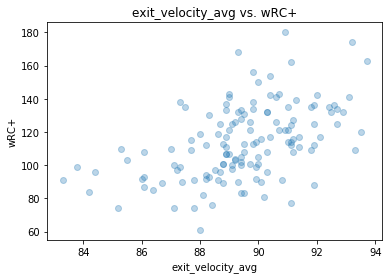

In [62]:
plt.scatter(data_2019['exit_velocity_avg'], data_2019['wRC_Plus'],alpha=0.3)
plt.xlabel('exit_velocity_avg')
plt.ylabel('wRC+')
plt.title('exit_velocity_avg vs. wRC+')

Text(0.5,1,'launch_angle_avg vs. wRC+')

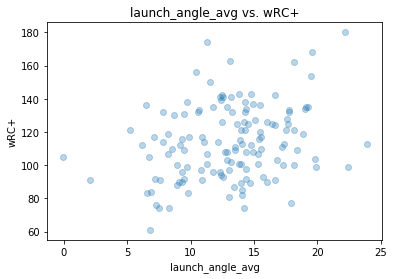

In [63]:
plt.scatter(data_2019['launch_angle_avg'], data_2019['wRC_Plus'],alpha=0.3)
plt.xlabel('launch_angle_avg')
plt.ylabel('wRC+')
plt.title('launch_angle_avg vs. wRC+')

Text(0.5,1,'barrels vs. wRC+')

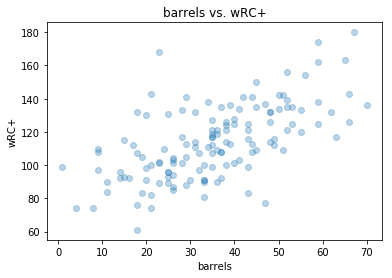

In [64]:
plt.scatter(data_2019['barrels'], data_2019['wRC_Plus'],alpha=0.3)
plt.xlabel('barrels')
plt.ylabel('wRC+')
plt.title('barrels vs. wRC+')

Text(0.5,1,'groundballs_percent vs. wRC+')

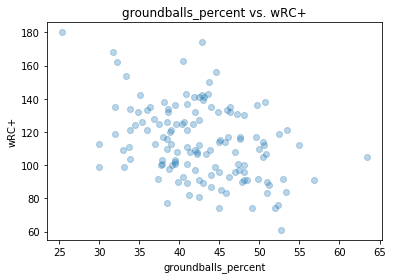

In [65]:
plt.scatter(data_2019['groundballs_percent'], data_2019['wRC_Plus'],alpha=0.3)
plt.xlabel('groundballs_percent')
plt.ylabel('wRC+')
plt.title('groundballs_percent vs. wRC+')

Text(0.5,1,'flyballs_percent vs. wRC+')

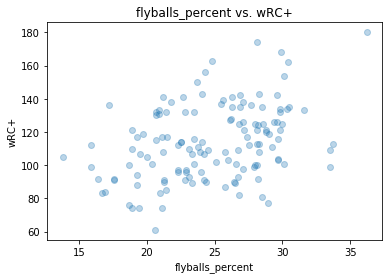

In [66]:
plt.scatter(data_2019['flyballs_percent'], data_2019['wRC_Plus'],alpha=0.3)
plt.xlabel('flyballs_percent')
plt.ylabel('wRC+')
plt.title('flyballs_percent vs. wRC+')

Text(0.5,1,'linedrives_percent vs. wRC+')

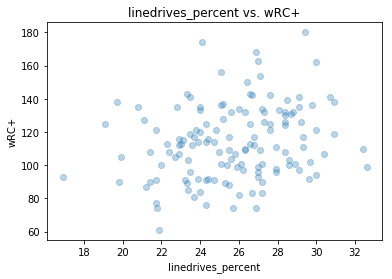

In [67]:
plt.scatter(data_2019['linedrives_percent'], data_2019['wRC_Plus'],alpha=0.3)
plt.xlabel('linedrives_percent')
plt.ylabel('wRC+')
plt.title('linedrives_percent vs. wRC+')

In [68]:
print('Correlation coefficients with OPS+')
for x in range(3,59):
    print(data_2019.columns[x])
    print(data_2019[data_2019.columns[x]].corr(data_2019['OPS_Plus']))
print('UBR')
print(data_2019[data_2019.columns[62]].corr(data_2019['OPS_Plus']))

Correlation coefficients with OPS+
xba
0.6219346086546464
xslg
0.8063824872034708
xwoba
0.855268137670435
xobp
0.7772153680100699
xiso
0.7159793280764964
exit_velocity_avg
0.5276788277746726
launch_angle_avg
0.2923211240640771
sweet_spot_percent
0.3723173468918423
barrels
0.6590451709951507
barrel_batted_rate
0.6013453789194733
solidcontact_percent
0.39123530562889797
flareburner_percent
-0.04537750264521072
poorlyunder_percent
0.019028327066675614
poorlytopped_percent
-0.426290569921505
poorlyweak_percent
-0.10093610083990531
hard_hit_percent
0.5275276879669116
z_swing_percent
-0.07503452963867283
z_swing_miss_percent
0.03530899603221516
oz_swing_percent
-0.29215757700873907
oz_swing_miss_percent
0.02165801625768141
oz_contact_percent
-0.021269368491867235
out_zone_swing_miss
0.00568430816876763
out_zone_swing
-0.036923959587019314
out_zone_percent
0.3401287326694665
out_zone
0.40874638515071604
meatball_swing_percent
0.08563458699304743
meatball_percent
-0.3294039589919696
pitch_coun

The predictors' relationships with OPS+ appear to be similar to their relationships with wRC+. We will look further into these predictors: exit_velocity_avg, launch_angle_avg, barrels, groundballs_percent, flyballs_percent, linedrives_percent.

Text(0.5,1,'exit_velocity_avg vs. OPS+')

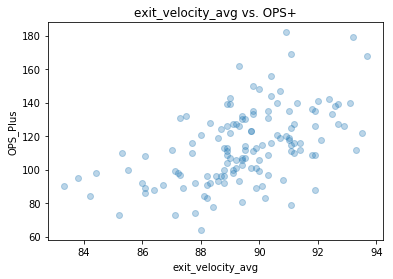

In [69]:
plt.scatter(data_2019['exit_velocity_avg'], data_2019['OPS_Plus'],alpha=0.3)
plt.xlabel('exit_velocity_avg')
plt.ylabel('OPS_Plus')
plt.title('exit_velocity_avg vs. OPS+')

Text(0.5,1,'launch_angle_avg vs. OPS+')

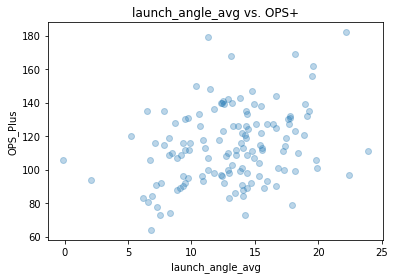

In [70]:
plt.scatter(data_2019['launch_angle_avg'], data_2019['OPS_Plus'],alpha=0.3)
plt.xlabel('launch_angle_avg')
plt.ylabel('OPS_Plus')
plt.title('launch_angle_avg vs. OPS+')

Text(0.5,1,'barrels vs. OPS+')

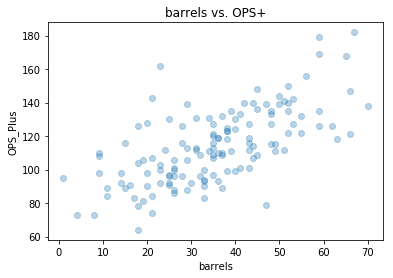

In [71]:
plt.scatter(data_2019['barrels'], data_2019['OPS_Plus'],alpha=0.3)
plt.xlabel('barrels')
plt.ylabel('OPS_Plus')
plt.title('barrels vs. OPS+')

Text(0.5,1,'groundballs_percent vs. OPS+')

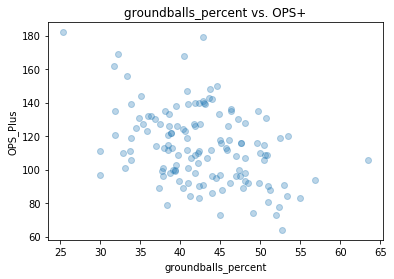

In [72]:
plt.scatter(data_2019['groundballs_percent'], data_2019['OPS_Plus'],alpha=0.3)
plt.xlabel('groundballs_percent')
plt.ylabel('OPS_Plus')
plt.title('groundballs_percent vs. OPS+')

Text(0.5,1,'flyballs_percent vs. OPS+')

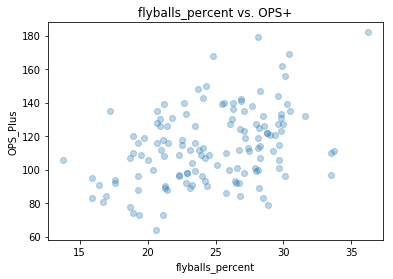

In [73]:
plt.scatter(data_2019['flyballs_percent'], data_2019['OPS_Plus'],alpha=0.3)
plt.xlabel('flyballs_percent')
plt.ylabel('OPS_Plus')
plt.title('flyballs_percent vs. OPS+')

Text(0.5,1,'linedrives_percent vs. OPS+')

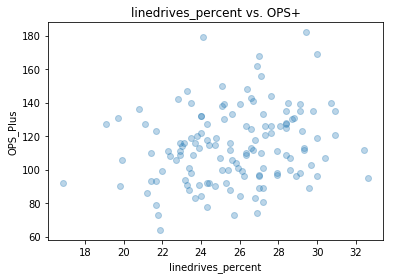

In [74]:
plt.scatter(data_2019['linedrives_percent'], data_2019['OPS_Plus'],alpha=0.3)
plt.xlabel('linedrives_percent')
plt.ylabel('OPS_Plus')
plt.title('linedrives_percent vs. OPS+')

# 2018 Analysis:
Correlation coefficients are largely similar to the 2019 coefficients. However, the association between launch_angle_avg and wRC+ is weaker in 2018, with a correlation of .21 compared to .28 in 2019.

In [75]:
print('Correlation coefficients with wRC+')
for x in range(3,59):
    print(data_2018.columns[x])
    print(data_2018[data_2018.columns[x]].corr(data_2018['wRC_Plus']))
print('UBR')
print(data_2018[data_2018.columns[62]].corr(data_2018['wRC_Plus']))

Correlation coefficients with wRC+
xba
0.559728065401097
xslg
0.760267148037883
xwoba
0.8500397383039976
xobp
0.7911183931627869
xiso
0.662991565875508
exit_velocity_avg
0.5165326965517083
launch_angle_avg
0.20999825177445922
sweet_spot_percent
0.39782187818862597
barrels
0.6314298194363427
barrel_batted_rate
0.5433642834330179
solidcontact_percent
0.47424558637709263
flareburner_percent
-0.04102365635189601
poorlyunder_percent
-0.058856442619052686
poorlytopped_percent
-0.31629096254921363
poorlyweak_percent
-0.09169035531754693
hard_hit_percent
0.5396533470504986
z_swing_percent
-0.0927848134162572
z_swing_miss_percent
0.017757126751879963
oz_swing_percent
-0.33420679596762404
oz_swing_miss_percent
0.0641815302923406
oz_contact_percent
-0.06396052978060364
out_zone_swing_miss
0.0006334157051038083
out_zone_swing
-0.06581837990035493
out_zone_percent
0.20385629492403057
out_zone
0.46425164406075997
meatball_swing_percent
0.04467221728069587
meatball_percent
-0.0896289408439306
pitch_c

In [76]:
print('Correlation coefficients with OPS+')
for x in range(3,59):
    print(data_2018.columns[x])
    print(data_2018[data_2018.columns[x]].corr(data_2018['OPS_Plus']))
print('UBR')
print(data_2018[data_2018.columns[62]].corr(data_2018['OPS_Plus']))

Correlation coefficients with OPS+
xba
0.5653711951037476
xslg
0.7800711490127705
xwoba
0.8509216213687386
xobp
0.7780860058920083
xiso
0.6842115049392543
exit_velocity_avg
0.5286120329218587
launch_angle_avg
0.23379738729078078
sweet_spot_percent
0.411676553820215
barrels
0.6489031226438906
barrel_batted_rate
0.564029599605801
solidcontact_percent
0.4800561618057925
flareburner_percent
-0.045896575911552696
poorlyunder_percent
-0.040611114467082966
poorlytopped_percent
-0.341280276836142
poorlyweak_percent
-0.0979980599772989
hard_hit_percent
0.5482171988801585
z_swing_percent
-0.07054622439944637
z_swing_miss_percent
0.024347679325548335
oz_swing_percent
-0.30320473330992054
oz_swing_miss_percent
0.07914129681893319
oz_contact_percent
-0.07886685300546954
out_zone_swing_miss
0.024565238574449054
out_zone_swing
-0.04218553592755143
out_zone_percent
0.22045358399141368
out_zone
0.44948228740630497
meatball_swing_percent
0.061238081261978355
meatball_percent
-0.10240010533804308
pitch_c

Text(0.5,1,'launch_angle_avg vs. wRC+')

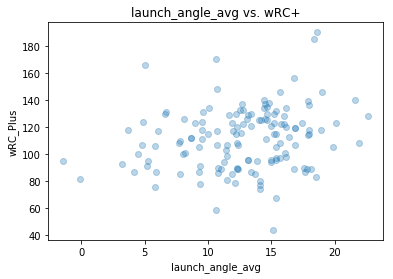

In [77]:
plt.scatter(data_2018['launch_angle_avg'], data_2018['wRC_Plus'],alpha=0.3)
plt.xlabel('launch_angle_avg')
plt.ylabel('wRC_Plus')
plt.title('launch_angle_avg vs. wRC+')

# 2017 Analysis: 
The launch angle and wRC+ correlation coefficient is also low in 2017, at just .19. The coefficient correlation between linedrives_percent and OPS+ is also very low at .13.

In [78]:
print('Correlation coefficients with wrC+')
for x in range(3,59):
    print(data_2017.columns[x])
    print(data_2017[data_2017.columns[x]].corr(data_2017['wRC_Plus']))
print('UBR')
print(data_2017[data_2017.columns[62]].corr(data_2017['wRC_Plus']))

Correlation coefficients with wrC+
xba
0.5292760913307207
xslg
0.7581559189272485
xwoba
0.81771180862695
xobp
0.7528641523026394
xiso
0.6599932434687182
exit_velocity_avg
0.46744552504423625
launch_angle_avg
0.1894658045179804
sweet_spot_percent
0.39749640815745074
barrels
0.5939138081150475
barrel_batted_rate
0.5478024145216865
solidcontact_percent
0.28650252427582
flareburner_percent
0.021312578515353682
poorlyunder_percent
-0.05358552988713756
poorlytopped_percent
-0.34542962723731563
poorlyweak_percent
-0.10740541287333608
hard_hit_percent
0.45655820283226806
z_swing_percent
-0.010709109340924257
z_swing_miss_percent
0.05557036328543956
oz_swing_percent
-0.37669772335536145
oz_swing_miss_percent
0.09704189370172975
oz_contact_percent
-0.09713998150294526
out_zone_swing_miss
-0.027194674504996286
out_zone_swing
-0.1724768323080974
out_zone_percent
0.24151653554042232
out_zone
0.3372620715074924
meatball_swing_percent
0.12627390955623016
meatball_percent
0.029783520452547882
pitch_co

In [79]:
print('Correlation coefficients with OPS+')
for x in range(3,59):
    print(data_2017.columns[x])
    print(data_2017[data_2017.columns[x]].corr(data_2017['OPS_Plus']))
print('UBR')
print(data_2017[data_2017.columns[62]].corr(data_2017['OPS_Plus']))

Correlation coefficients with OPS+
xba
0.5218355318785032
xslg
0.7641164693933155
xwoba
0.8040551234161799
xobp
0.7241436753999492
xiso
0.6695201874079626
exit_velocity_avg
0.4740558762526925
launch_angle_avg
0.19622772074913644
sweet_spot_percent
0.3824996964352323
barrels
0.6090440774456051
barrel_batted_rate
0.5586440752393195
solidcontact_percent
0.2913029324178044
flareburner_percent
0.0031964175908339265
poorlyunder_percent
-0.04842703101695819
poorlytopped_percent
-0.35079711437634026
poorlyweak_percent
-0.10355615450203119
hard_hit_percent
0.4615038047016423
z_swing_percent
0.019281744457763345
z_swing_miss_percent
0.06288756862134148
oz_swing_percent
-0.33930657618397486
oz_swing_miss_percent
0.10249826920790384
oz_contact_percent
-0.10249286707268214
out_zone_swing_miss
-0.0009916231292205202
out_zone_swing
-0.14181168986960413
out_zone_percent
0.2647259455091232
out_zone
0.3239442513474492
meatball_swing_percent
0.14095427172197095
meatball_percent
0.021547557226738397
pitch

Text(0.5,1,'launch_angle_avg vs. wRC+')

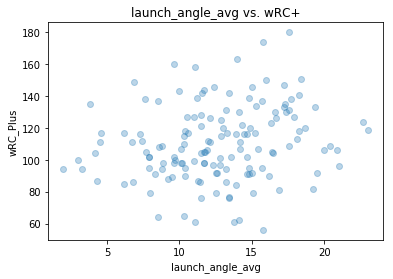

In [80]:
plt.scatter(data_2017['launch_angle_avg'], data_2017['wRC_Plus'],alpha=0.3)
plt.xlabel('launch_angle_avg')
plt.ylabel('wRC_Plus')
plt.title('launch_angle_avg vs. wRC+')

Text(0.5,1,'linedrives_percent vs. OPS+')

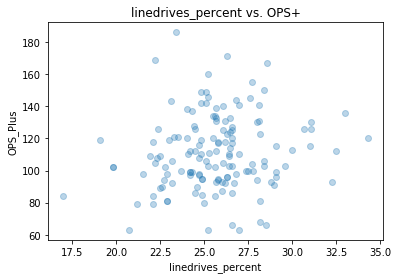

In [81]:
plt.scatter(data_2017['linedrives_percent'], data_2017['OPS_Plus'],alpha=0.3)
plt.xlabel('linedrives_percent')
plt.ylabel('OPS_Plus')
plt.title('linedrives_percent vs. OPS+')

# 2016 Analysis: 
The edge stat correlation with wRC+ was higher than 2017, 2018, and 2019 at .47. It was .24, .34, .31 respectively in those years. out_zone and pitch_count also seem to have moderately strong associations with OPS+ across most years. However, the out_zone correlation coefficient with OPS+ is particularly high in 2016 at .58.

In [82]:
print('Correlation coefficients with wRC+')
for x in range(3,58):
    print(data_2016.columns[x])
    print(data_2016[data_2016.columns[x]].corr(data_2016['wRC_Plus']))
print('UBR')
print(data_2016[data_2016.columns[61]].corr(data_2016['wRC_Plus']))

Correlation coefficients with wRC+
xba
0.6019827879239809
xslg
0.7862922174247027
xwoba
0.8543897774231163
xobp
0.7444849431365947
xiso
0.6710307473847551
exit_velocity_avg
0.5894934841665109
launch_angle_avg
0.19089286275633607
sweet_spot_percent
0.4609274600916617
barrels
0.654392725817324
barrel_batted_rate
0.5701688931179895
solidcontact_percent
0.4890600286030958
flareburner_percent
0.03755607220348636
poorlyunder_percent
-0.08431247794150383
poorlytopped_percent
-0.35792810214652654
poorlyweak_percent
-0.1839978959085584
hard_hit_percent
0.5703215361703106
z_swing_percent
0.025420043346079054
z_swing_miss_percent
0.027567544905702086
oz_swing_percent
-0.2720171483626219
oz_swing_miss_percent
0.0266599653780385
oz_contact_percent
-0.026222054288359248
out_zone_swing_miss
0.09147352820047916
out_zone_swing
0.12230592219895069
out_zone_percent
0.2714508298778835
out_zone
0.5793632356249061
meatball_swing_percent
0.150056019420249
meatball_percent
-0.21644966354493736
pitch_count_off

In [83]:
print('Correlation coefficients with OPS+')
for x in range(3,58):
    print(data_2016.columns[x])
    print(data_2016[data_2016.columns[x]].corr(data_2016['OPS_Plus']))
print('UBR')
print(data_2016[data_2016.columns[61]].corr(data_2016['OPS_Plus']))

Correlation coefficients with OPS+
xba
0.6103959009343728
xslg
0.8033965954660861
xwoba
0.8537080628606437
xobp
0.7287512414210713
xiso
0.6875614697373461
exit_velocity_avg
0.5916345087677766
launch_angle_avg
0.20149610268069418
sweet_spot_percent
0.4792946426626408
barrels
0.6709481418900195
barrel_batted_rate
0.5827410602004927
solidcontact_percent
0.49170788652936337
flareburner_percent
0.02862177648456867
poorlyunder_percent
-0.07205612303970833
poorlytopped_percent
-0.36930719721951816
poorlyweak_percent
-0.19691432105978718
hard_hit_percent
0.5731400275831304
z_swing_percent
0.056849078099695555
z_swing_miss_percent
0.03413897238233357
oz_swing_percent
-0.2260145804541773
oz_swing_miss_percent
0.017290904755299676
oz_contact_percent
-0.016912350652688604
out_zone_swing_miss
0.11143370534162748
out_zone_swing
0.16481529714381957
out_zone_percent
0.3065570377629263
out_zone
0.5768110191212398
meatball_swing_percent
0.16180255723234593
meatball_percent
-0.24379277924424708
pitch_cou

Text(0.5,1,'edge vs. wRC+')

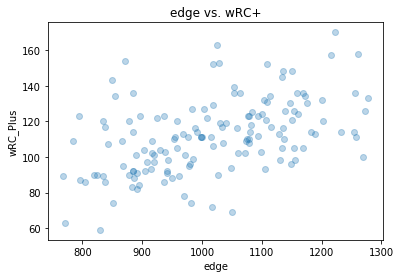

In [84]:
plt.scatter(data_2016['edge'], data_2016['wRC_Plus'],alpha=0.3)
plt.xlabel('edge')
plt.ylabel('wRC_Plus')
plt.title('edge vs. wRC+')

Text(0.5,1,'out_zone vs. OPS+')

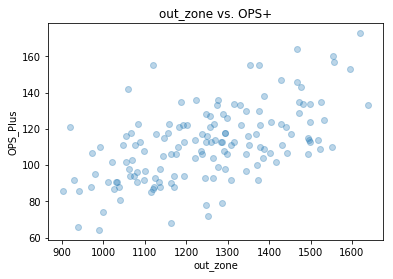

In [85]:
plt.scatter(data_2016['out_zone'], data_2016['OPS_Plus'],alpha=0.3)
plt.xlabel('out_zone')
plt.ylabel('OPS_Plus')
plt.title('out_zone vs. OPS+')

Text(0.5,1,'pitch_count vs. OPS+')

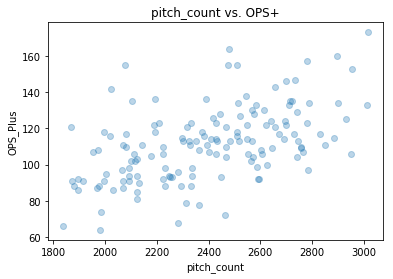

In [86]:
plt.scatter(data_2016['pitch_count'], data_2016['OPS_Plus'],alpha=0.3)
plt.xlabel('pitch_count')
plt.ylabel('OPS_Plus')
plt.title('pitch_count vs. OPS+')

# 2015 Analysis: 
The associations between wRC+ and barrels, hard_hit_percent, out_zone, and pitch_count are particularly strong. The same goes for these predictors and OPS+, with the correlation coefficient between OPS+ and barrels eclipsing .7.

In [87]:
print('Correlation coefficients with wRC+')
for x in range(3,58):
    print(data_2015.columns[x])
    print(data_2015[data_2015.columns[x]].corr(data_2015['wRC_Plus']))
print('UBR')
print(data_2015[data_2015.columns[61]].corr(data_2015['wRC_Plus']))

Correlation coefficients with wRC+
xba
0.5111685838366365
xslg
0.771392024448997
xwoba
0.8556053989124681
xobp
0.8296500220745336
xiso
0.7018430071405252
exit_velocity_avg
0.6234757168619248
launch_angle_avg
0.23782858210772032
sweet_spot_percent
0.40166440596367575
barrels
0.6936297582740992
barrel_batted_rate
0.6611332066010149
solidcontact_percent
0.4972882093141467
flareburner_percent
-0.0318943670463817
poorlyunder_percent
-0.06039116776912075
poorlytopped_percent
-0.34899384916005866
poorlyweak_percent
-0.17726848233265932
hard_hit_percent
0.6276636707492848
z_swing_percent
-0.0851622266426286
z_swing_miss_percent
0.21373434288851784
oz_swing_percent
-0.3823483297308334
oz_swing_miss_percent
0.1293222763196103
oz_contact_percent
-0.12935537599956543
out_zone_swing_miss
0.14443684940597695
out_zone_swing
0.058360417992648635
out_zone_percent
0.3767121008327942
out_zone
0.6175493447075272
meatball_swing_percent
-0.04312765722684394
meatball_percent
-0.2443578212437502
pitch_count_o

In [88]:
print('Correlation coefficients with OPS+')
for x in range(3,58):
    print(data_2015.columns[x])
    print(data_2015[data_2015.columns[x]].corr(data_2015['OPS_Plus']))
print('UBR')
print(data_2015[data_2015.columns[61]].corr(data_2015['OPS_Plus']))

Correlation coefficients with OPS+
xba
0.5134382050308388
xslg
0.7833739523515986
xwoba
0.8568861452404937
xobp
0.8232039959826951
xiso
0.714820412885042
exit_velocity_avg
0.6312128178389306
launch_angle_avg
0.24256500481226653
sweet_spot_percent
0.4118092744302752
barrels
0.708801216904554
barrel_batted_rate
0.6746702308884343
solidcontact_percent
0.5076601535578967
flareburner_percent
-0.03975830097498634
poorlyunder_percent
-0.059430623713957645
poorlytopped_percent
-0.35380141401345905
poorlyweak_percent
-0.18057964138577717
hard_hit_percent
0.6322010510600908
z_swing_percent
-0.07712323972489452
z_swing_miss_percent
0.22229973597554836
oz_swing_percent
-0.3571329907675464
oz_swing_miss_percent
0.12681415850862998
oz_contact_percent
-0.12685418422759706
out_zone_swing_miss
0.15924684733145225
out_zone_swing
0.08617661067809007
out_zone_percent
0.38827678211120975
out_zone
0.6216094395086837
meatball_swing_percent
-0.03616928400531675
meatball_percent
-0.25660380166756175
pitch_coun

Text(0.5,1,'barrels vs. wRC+')

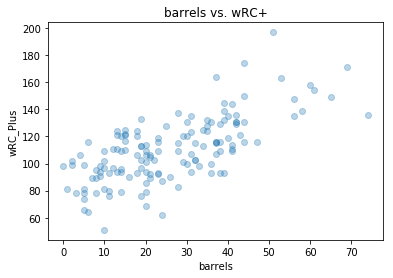

In [89]:
plt.scatter(data_2015['barrels'], data_2015['wRC_Plus'],alpha=0.3)
plt.xlabel('barrels')
plt.ylabel('wRC_Plus')
plt.title('barrels vs. wRC+')

Text(0.5,1,'hard_hit_percent vs. wRC+')

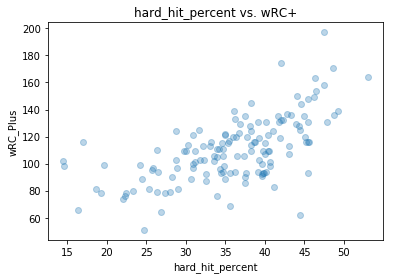

In [90]:
plt.scatter(data_2015['hard_hit_percent'], data_2015['wRC_Plus'],alpha=0.3)
plt.xlabel('hard_hit_percent')
plt.ylabel('wRC_Plus')
plt.title('hard_hit_percent vs. wRC+')

Text(0.5,1,'out_zone vs. wRC+')

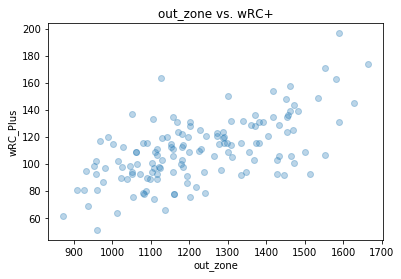

In [91]:
plt.scatter(data_2015['out_zone'], data_2015['wRC_Plus'],alpha=0.3)
plt.xlabel('out_zone')
plt.ylabel('wRC_Plus')
plt.title('out_zone vs. wRC+')

Text(0.5,1,'pitch_count vs. wRC+')

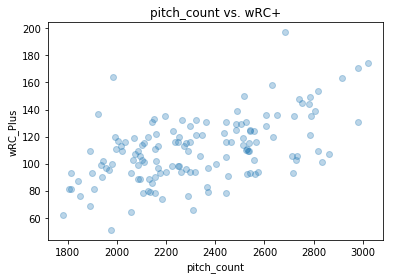

In [92]:
plt.scatter(data_2015['pitch_count'], data_2015['wRC_Plus'],alpha=0.3)
plt.xlabel('pitch_count')
plt.ylabel('wRC_Plus')
plt.title('pitch_count vs. wRC+')

Text(0.5,1,'barrels vs. OPS+')

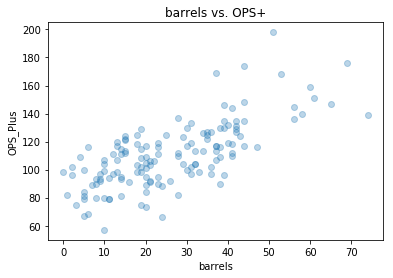

In [93]:
plt.scatter(data_2015['barrels'], data_2015['OPS_Plus'],alpha=0.3)
plt.xlabel('barrels')
plt.ylabel('OPS_Plus')
plt.title('barrels vs. OPS+')

Text(0.5,1,'hard_hit_percent vs. OPS+')

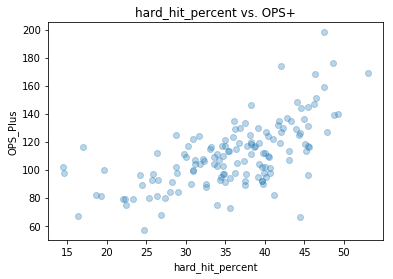

In [94]:
plt.scatter(data_2015['hard_hit_percent'], data_2015['OPS_Plus'],alpha=0.3)
plt.xlabel('hard_hit_percent')
plt.ylabel('OPS_Plus')
plt.title('hard_hit_percent vs. OPS+')

Text(0.5,1,'out_zone vs. OPS+')

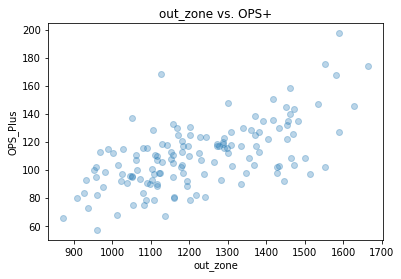

In [95]:
plt.scatter(data_2015['out_zone'], data_2015['OPS_Plus'],alpha=0.3)
plt.xlabel('out_zone')
plt.ylabel('OPS_Plus')
plt.title('out_zone vs. OPS+')

Text(0.5,1,'pitch_count vs. OPS+')

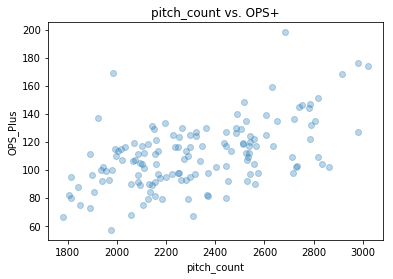

In [96]:
plt.scatter(data_2015['pitch_count'], data_2015['OPS_Plus'],alpha=0.3)
plt.xlabel('pitch_count')
plt.ylabel('OPS_Plus')
plt.title('pitch_count vs. OPS+')

In [102]:
#Correlation coefficients between sprint speed and UBR
print("2015: " + str(round(data_2015[data_2015.columns[57]].corr(data_2015['UBR']),2)))
print("2016: " + str(round(data_2016[data_2016.columns[57]].corr(data_2016['UBR']),2)))
print("2017: " + str(round(data_2017[data_2017.columns[58]].corr(data_2017['UBR']),2)))
print("2018: " + str(round(data_2018[data_2018.columns[58]].corr(data_2018['UBR']),2)))
print("2019: " + str(round(data_2019[data_2019.columns[58]].corr(data_2019['UBR']),2)))

2015: 0.55
2016: 0.68
2017: 0.63
2018: 0.62
2019: 0.57


Final thoughts: The "expected" variables had high correlation coefficients with both wRC+ and OPS+. This is likely because they themselves also measure offensive value of players more broadly than most of the statcast stats, similar to wRC+ and OPS+. We need to think and discuss about whether these variables are more appropriate to use as predictors, response variables, or if we should not use them at all. Generally, launch angle average was not strongly associated with wRC+ and OPS+, which was somewhat unexpected for us, but it does make some sense because a very low or very high launch angle is generally undesirable. Exit velocity average and barrels were two other variables which generally had relatively high correlation coefficients. Some other potentially significant variables we found were edge, out_zone, hard_hit_percent, and pitch_count. Finally, we also took a look at the association between sprint_speed and UBR, and found that it was a fairly strong relationship, as expected, but there could also be more factors associated with UBR to do research on in the future.